# Exploratory Analysis
## Import data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.pyplot import figure
%matplotlib inline
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import ccf

import os
import csv

In [2]:
# import and look at data
prices_sales_df = pd.read_csv('price-and-sales-data.csv')

# make headers lower case for simpler coding
prices_sales_df.columns = map(str.lower, prices_sales_df.columns)

# convert date to datetime object
prices_sales_df['date'] = pd.to_datetime(prices_sales_df['date'], format='%Y-%m-%d')

# convert year to dtype = object
prices_sales_df['year'] = prices_sales_df['year'].astype('object')

# set date to index
prices_sales_df.set_index('date', inplace=True)

# look at data
prices_sales_df.head()

,averageprice,totalvolume,4046,4225,4770,totalbags,smallbags,largebags,xlargebags,type,year,region
date,,,,,,,,,,,,
2015-01-04,1.22,40873.28,2819.50,28287.42,49.90,9716.46,9186.93,529.53,0.0,conventional,2015,Albany
2015-01-04,1.00,435021.49,364302.39,23821.16,82.15,46815.79,16707.15,30108.64,0.0,conventional,2015,Atlanta
2015-01-04,NaN,788025.06,53987.31,552906.04,39995.03,141136.68,137146.07,3990.61,0.0,conventional,2015,BaltimoreWashington
2015-01-04,1.01,80034.32,44562.12,24964.23,2752.35,7755.62,6064.30,1691.32,0.0,conventional,2015,Boise
2015-01-04,1.02,491738.00,7193.87,396752.18,128.82,87663.13,87406.84,256.29,0.0,conventional,2015,Boston


In [3]:
# import data
google_df = pd.read_csv('google-data.csv')

# make headers lower case for simpler coding
google_df.columns = map(str.lower, google_df.columns)

#change column name: week to date
google_df.rename(columns={'week':'date'}, inplace=True)

# convert date to datetime object
google_df['date'] = pd.to_datetime(google_df['date'], format='%Y-%m-%d')

# set date to index
google_df.set_index('date', inplace=True)

# for each column name: add prefix (gst => google search term), remove the last 17 characters (USA etc.), and 
# replace spaces with _
google_df.columns = ['gst_'+col[:-17].replace(' ', '_') for col in google_df.columns]

# look at data
google_df.head()

,gst_avocado,gst_organic,gst_avocado_recipe,gst_avocado_toast,gst_avocado_sandwich,gst_organic_avocado
date,,,,,,
2015-01-04,46,76,84,8,51,10
2015-01-11,48,79,76,8,38,29
2015-01-18,48,82,84,9,66,27
2015-01-25,49,82,89,8,44,28
2015-02-01,52,81,82,7,46,42


In [4]:
# join dataframes on the week (date)
df = prices_sales_df.join(google_df, on='date', how='left')
df.head()

,averageprice,totalvolume,4046,4225,4770,totalbags,smallbags,largebags,xlargebags,type,year,region,gst_avocado,gst_organic,gst_avocado_recipe,gst_avocado_toast,gst_avocado_sandwich,gst_organic_avocado
date,,,,,,,,,,,,,,,,,,
2015-01-04,1.22,40873.28,2819.50,28287.42,49.90,9716.46,9186.93,529.53,0.0,conventional,2015,Albany,46.0,76.0,84.0,8.0,51.0,10.0
2015-01-04,1.00,435021.49,364302.39,23821.16,82.15,46815.79,16707.15,30108.64,0.0,conventional,2015,Atlanta,46.0,76.0,84.0,8.0,51.0,10.0
2015-01-04,NaN,788025.06,53987.31,552906.04,39995.03,141136.68,137146.07,3990.61,0.0,conventional,2015,BaltimoreWashington,46.0,76.0,84.0,8.0,51.0,10.0
2015-01-04,1.01,80034.32,44562.12,24964.23,2752.35,7755.62,6064.30,1691.32,0.0,conventional,2015,Boise,46.0,76.0,84.0,8.0,51.0,10.0
2015-01-04,1.02,491738.00,7193.87,396752.18,128.82,87663.13,87406.84,256.29,0.0,conventional,2015,Boston,46.0,76.0,84.0,8.0,51.0,10.0


In [5]:
# sort on date
df.sort_index(inplace=True)

In [6]:
# use a simple mathematical formula to compress a month to a season (1:winter, 2:spring, 3:summer, 4:fall)
df['season'] = (df.index.month%12 + 3)//3

# change the dtype to object
df['season'] = df['season'].astype('object')

### Important note
There is a **unique key** for this dataset: **[date, region, type]**.

## NULL inspection

We need to have weekly values for each date/region combination between the minimum and maximum dates in the original dataset. For each date/region combination, we will:    

    A) check for extra dates (out of expected weekly sequence)
    B) check for missing dates (based on expected weekly sequence)
    C) use forwardfill to fill nulls
    D) use backwardfill to fill remaining nulls

In [7]:
pd.isnull(df).sum()

averageprice            902
totalvolume             949
4046                    900
4225                    906
4770                    916
totalbags               890
smallbags               934
largebags               947
xlargebags              868
type                      0
year                      0
region                    0
gst_avocado             108
gst_organic             108
gst_avocado_recipe      108
gst_avocado_toast       108
gst_avocado_sandwich    108
gst_organic_avocado     108
season                    0
dtype: int64

Since this is a time series, let's see if we can locate the nulls to handle them properly.

### Visualize NULLs for each unique key

Text(0.5, 1, 'NULL Google search term totals')

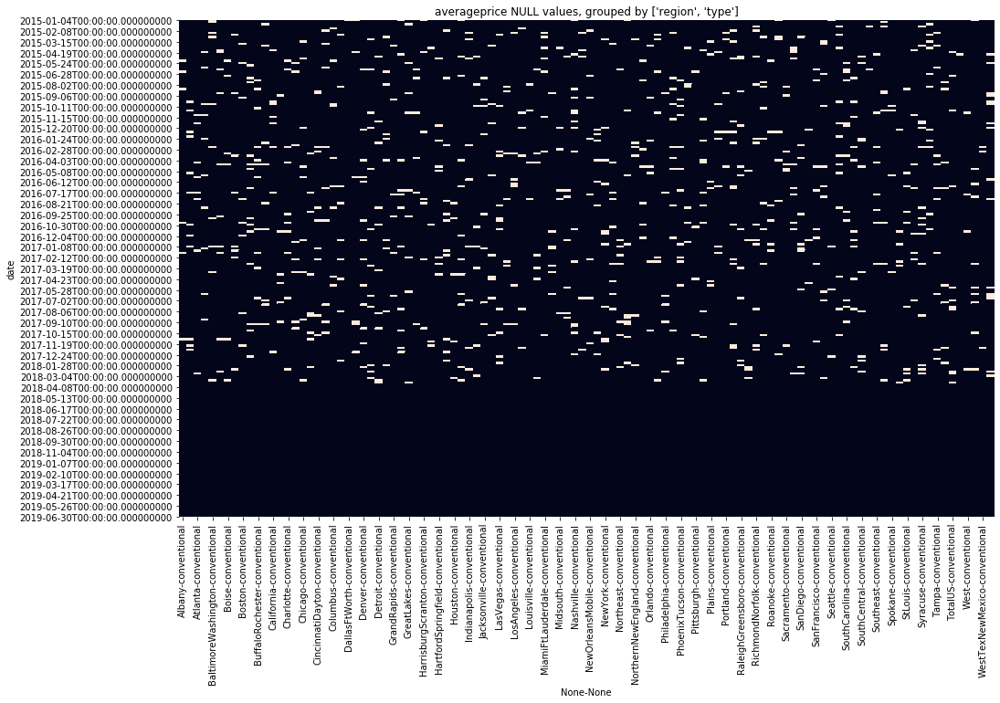

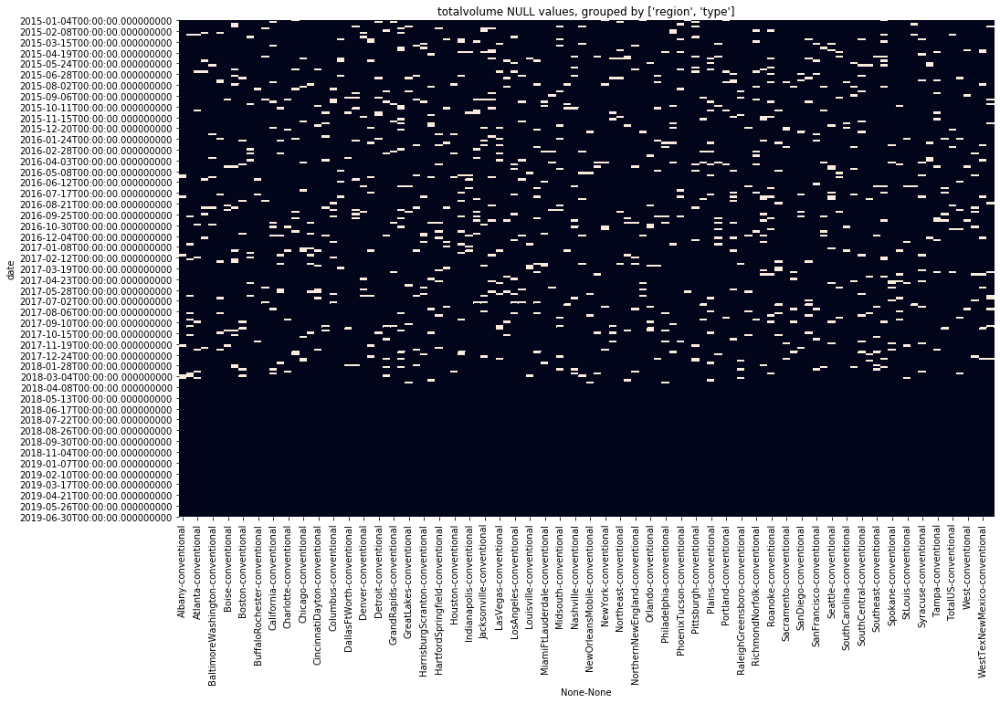

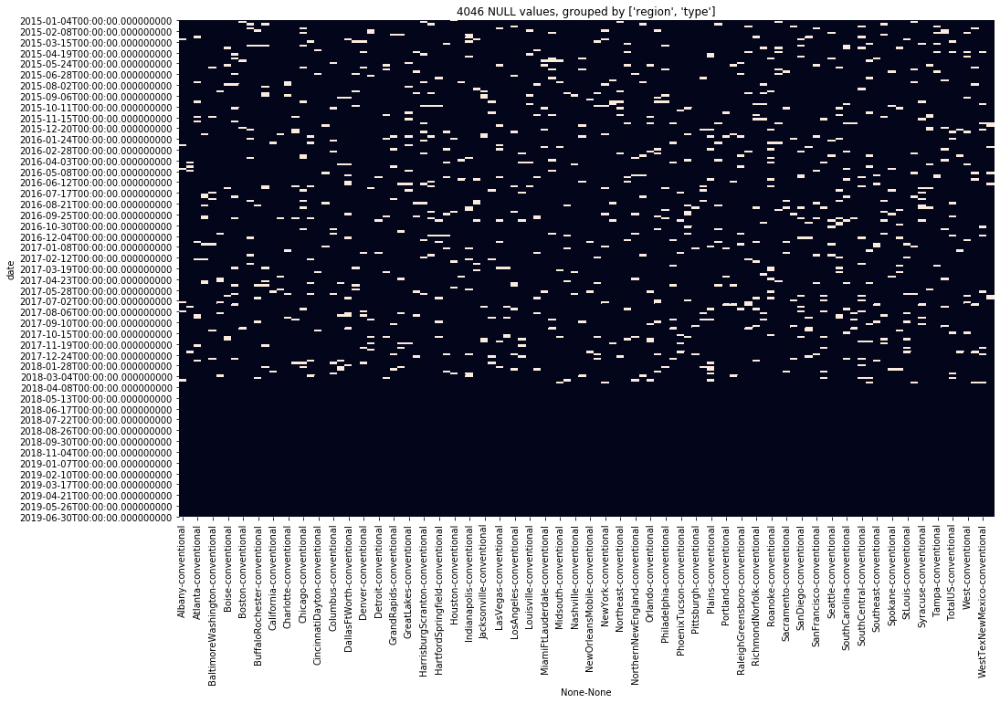

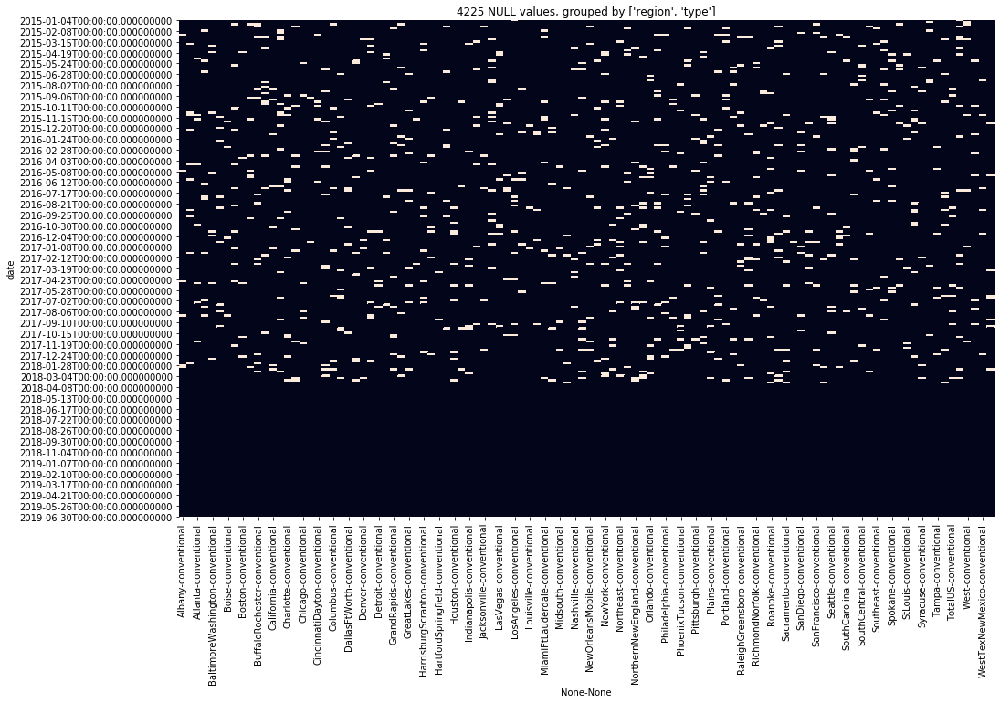

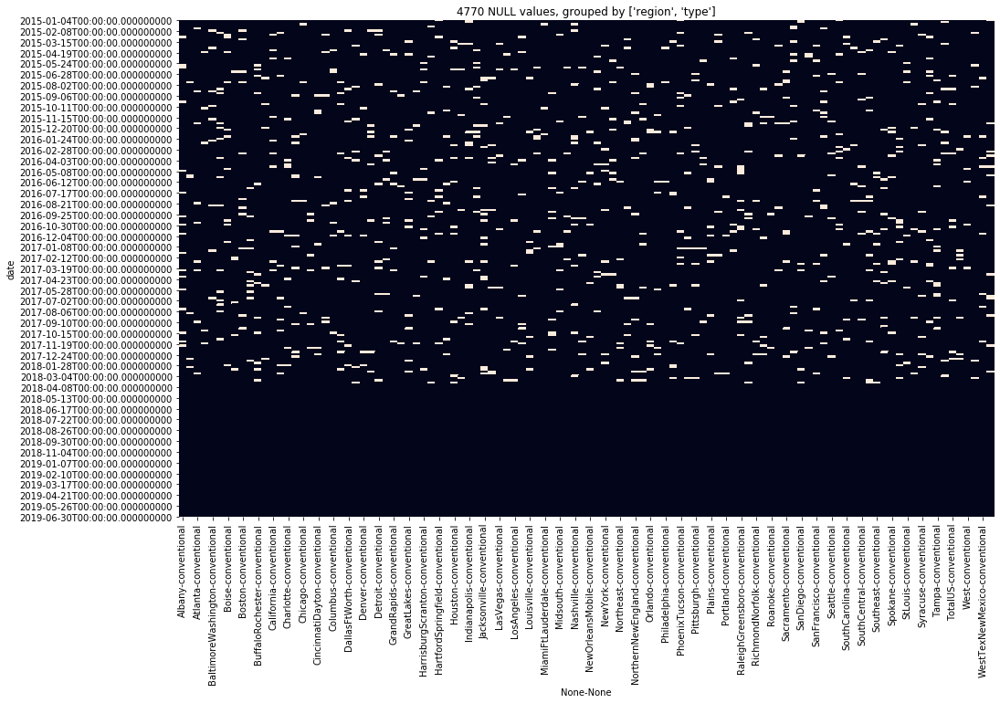

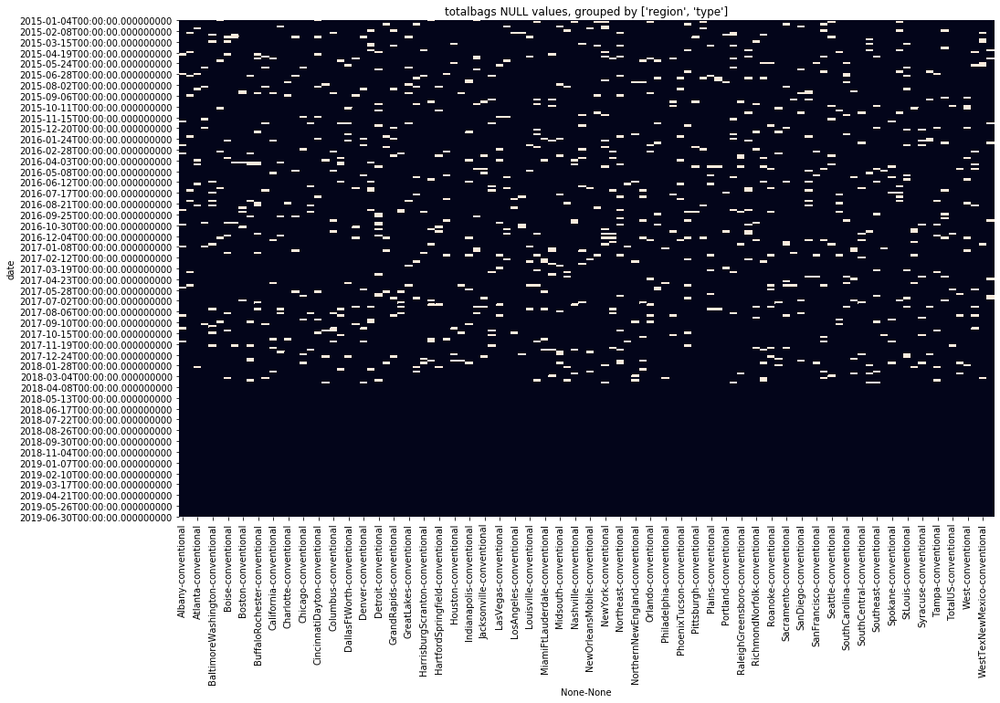

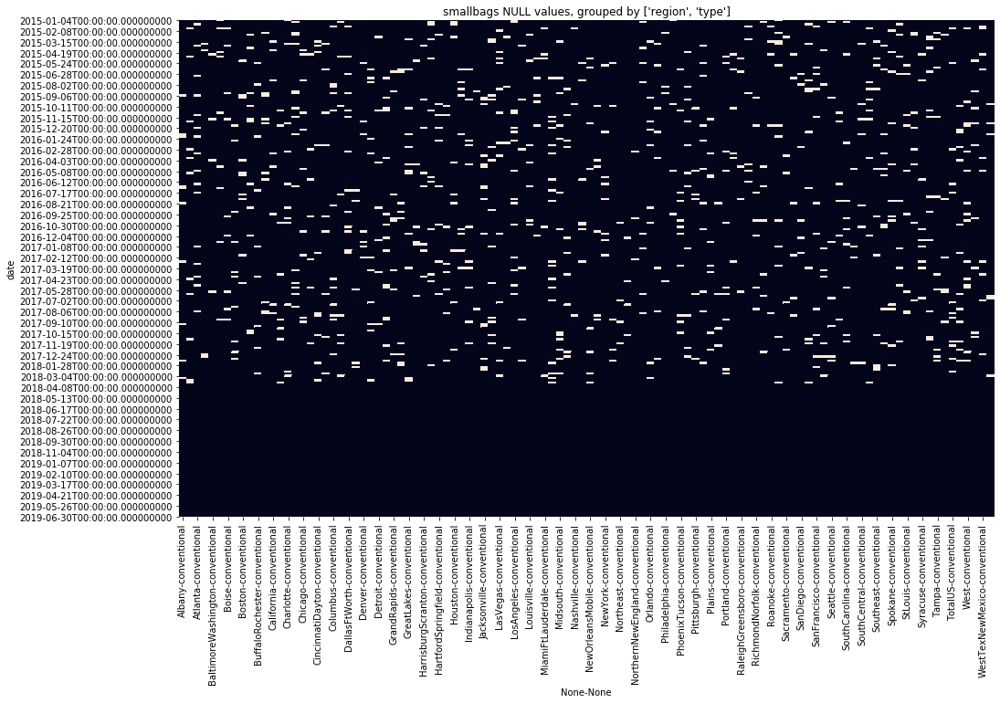

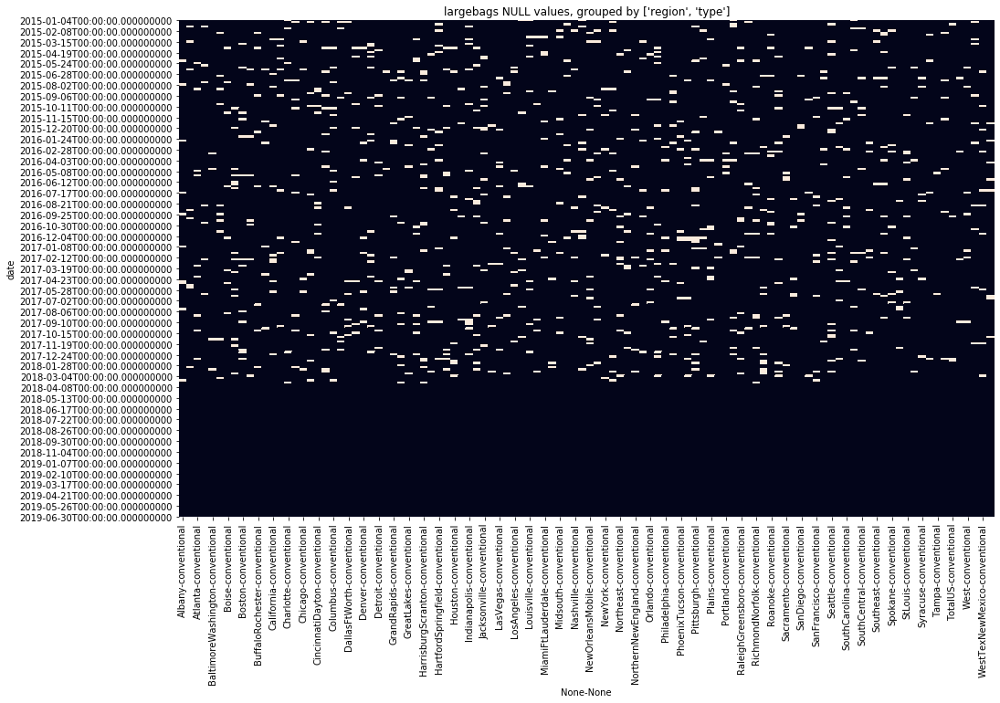

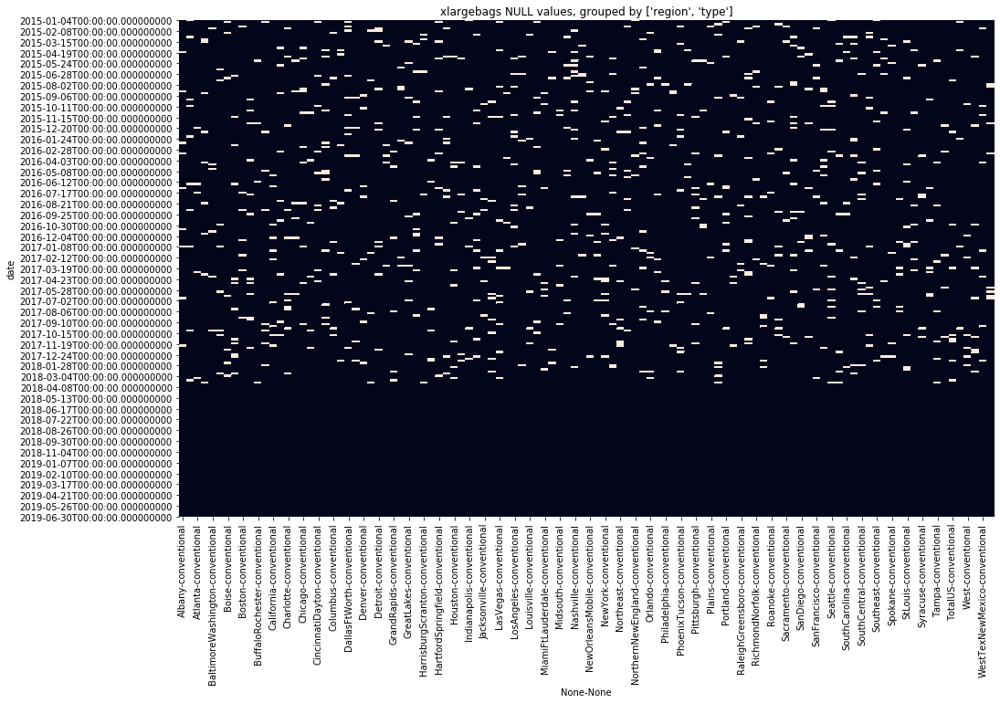

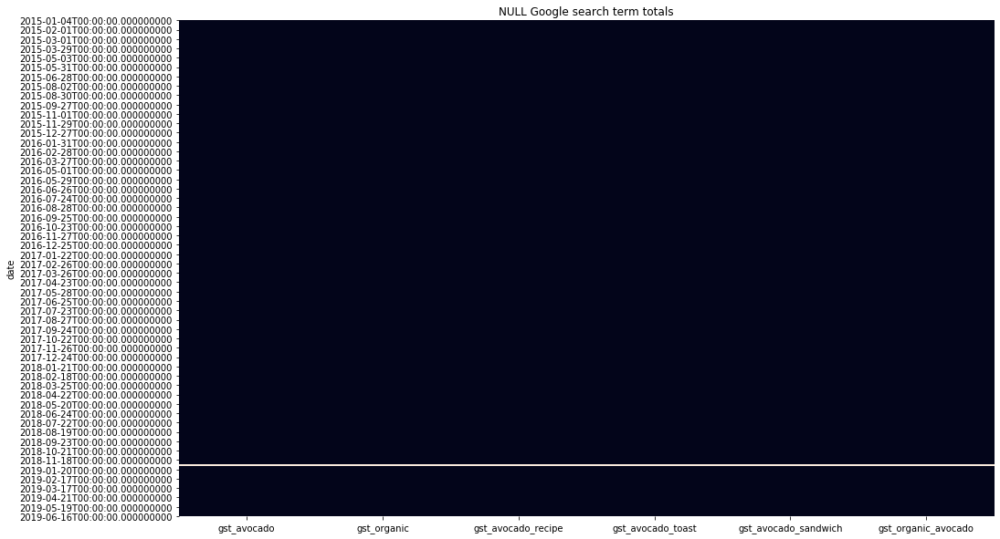

In [8]:
#grab google search term var names
google_vars = list(google_df.columns)

#grab var names that have null values, minus the 6 google vars at the end
null_sales_vars = list(df.columns[df.isnull().any()])[:-6]

#graph sales vars with null values, grouped by unique key:
for i in range(len(null_sales_vars)):
    #create a grouped df
    by = ['region', 'type']
    grouped_df = pd.DataFrame({col:vals[null_sales_vars[i]] for col, vals in df.groupby(by)})

    #create a heatmap of nulls, grouped by their unique key:  
    plt.figure(figsize = (16,10))
    ax = sns.heatmap(grouped_df.isnull(), cbar=False)
    ax.set_title('{} NULL values, grouped by {}'.format(null_sales_vars[i], by))
    
#graph google vars with null values:
plt.figure(figsize = (16,10))
ax = sns.heatmap(df.loc[:, google_vars].isnull(), cbar=False)
ax.set_title('NULL Google search term totals')

### Note on filling NULLS
Since there is a **unique key** in this dataset **[date, region, type]**, we need to take care to **fill nans using fillforward based on the key**.

In [9]:
def fill_gaps_and_nulls(df):
    '''
    General steps:
    1) grab rows with a particular region and type; for each group:
        A) check for extra dates (out of weekly sequence)
        B) check for missing dates (based on weekly sequence)
        C) use forwardfill to fill nulls
        D) use backwardfill to fill remaining nulls
        E) append to file    
    '''
    #sort to make indexing faster
    df = df.sort_values(by=['date','region','type'], inplace=False)

    #create an artificial index of weekly dates with the same beginning and ending as the original data
    all_dates = pd.date_range(start=df.index.min(), end=df.index.max(), freq='7D')

    #collect all possible regions and types
    regions = list(set(df['region']))
    types = list(set(df['type']))

    #reindex so we can have date as a mutable column
    df = df.reset_index(inplace=False)

    #record column names
    df_cols = df.columns

    #delete ffill_df.csv so we can begin anew
    try:
        os.remove('ffill_df.csv')
    except FileNotFoundError:
        pass

    for r in regions:
        for t in types:
            #grab group of records having r and t
            group_df = df[(df.region == r) & (df.type == t)].copy()
            
            #check for extra dates and/or dates out of order. print warning statement for log
            extra_dates = set(group_df.date).difference(all_dates)
            #if there are extra dates, deal with them
            if len(extra_dates) > 0:
                print('WARNING: {} {} has extra date(s):\n\t{}\n\t    Shifting highlighted date(s) back by 1 day'.format(
                    r, t, extra_dates))
                for date in extra_dates:
                    #shift extra dates back one day
                    group_df.date[group_df.date == date] = date - pd.Timedelta(days=1)
            
            #check the artificial date index against each group to identify missing gaps in time and fill them with nulls
            gaps = all_dates.difference(set(group_df.date))
            print('\n-------\nWARNING: {} {} has missing dates: {}\n-------\n'.format(r, t, gaps))
            
            #if there are time gaps, deal with them
            if len(gaps) > 0:
                #initialize df of correct size, filled with nulls
                gaps_df = pd.DataFrame(index=gaps, columns=df_cols.drop('date')) #len(index) sets number of rows
                #give index a name
                gaps_df.index.name = 'date'
                #add the region and type
                gaps_df.region = r
                gaps_df.type = t
                #remove that index so gaps_df and group_df are compatible
                gaps_df.reset_index(inplace=True)                
                #append gaps_df to group_df
                new_df = pd.concat([group_df, gaps_df])
                #sort on date
                new_df.sort_values(by='date', inplace=True)

            #fill nulls
            new_df.fillna(method='ffill', inplace=True)
            new_df.fillna(method='bfill', inplace=True)

            #append to file
            new_df.to_csv('ffill_df.csv', mode='a', header=False, index=False) 
    
    return df_cols, regions, types, all_dates

In [10]:
df_cols, regions, types, all_dates = fill_gaps_and_nulls(df)

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day


C:\Users\rc\Anaconda3\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted da

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 da


-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted da

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 day

-------
-------

	{Timestamp('2019-01-07 00:00:00')}
	    Shifting highlighted date(s) back by 1 da

In [11]:
#load in the ffill_df
ffill_df = pd.read_csv('ffill_df.csv', header=None, index_col=None)
ffill_df.columns = df_cols
ffill_df.index= ffill_df.date
ffill_df.drop('date', axis=1, inplace=True)
ffill_df.head()

,averageprice,totalvolume,4046,4225,4770,totalbags,smallbags,largebags,xlargebags,type,year,region,gst_avocado,gst_organic,gst_avocado_recipe,gst_avocado_toast,gst_avocado_sandwich,gst_organic_avocado,season
date,,,,,,,,,,,,,,,,,,,
2015-01-04,1.10,407675.56,24190.91,294715.33,2121.45,86647.87,72829.94,13817.93,0.0,conventional,2015,Philadelphia,46.0,76.0,84.0,8.0,51.0,10.0,1
2015-01-11,1.38,315984.22,14323.61,198387.14,1715.41,101558.06,88980.00,12578.06,0.0,conventional,2015,Philadelphia,48.0,79.0,76.0,8.0,38.0,29.0,1
2015-01-18,1.40,331495.41,15116.27,209523.15,1469.44,105386.55,93250.96,12135.59,0.0,conventional,2015,Philadelphia,48.0,82.0,84.0,9.0,66.0,27.0,1
2015-01-25,1.36,355645.73,16112.50,211453.65,1409.19,126670.39,110991.22,15679.17,0.0,conventional,2015,Philadelphia,49.0,82.0,89.0,8.0,44.0,28.0,1
2015-02-01,1.14,569304.80,30263.22,417993.89,1722.10,119325.59,104365.66,14959.93,0.0,conventional,2015,Philadelphia,52.0,81.0,82.0,7.0,46.0,42.0,1


In [12]:
#check results
print(df.shape)        
print(ffill_df.shape)
rec = len(regions) * len(types) * len(all_dates)
print('New dataframe *should* have \n\t{} records.\nNew dataframe *has*\n\t{} records\nDifference:\n\t{} records'.format(
    rec, ffill_df.shape[0], rec - ffill_df.shape[0]))
print()
print(pd.isnull(ffill_df).sum())

(25161, 19)
(25596, 19)
New dataframe *should* have 
	25596 records.
New dataframe *has*
	25596 records
Difference:
	0 records

averageprice            0
totalvolume             0
4046                    0
4225                    0
4770                    0
totalbags               0
smallbags               0
largebags               0
xlargebags              0
type                    0
year                    0
region                  0
gst_avocado             0
gst_organic             0
gst_avocado_recipe      0
gst_avocado_toast       0
gst_avocado_sandwich    0
gst_organic_avocado     0
season                  0
dtype: int64


## Train / Validation / Test Splits

Since this is time series data, we want full years (with all their seasonal variations) to exist in the train, validation, and test set. Therefore, the validation and test set will each be 12 sequential months, and the training set will be the roughly 2.5 years left over (2015 through mid-2017)

In [13]:
#sort df
ffill_df.sort_values(by=['date','region','type'], inplace=True)

#create sets
train = ffill_df['2015':'2017-07']
print('training set:\n\t{} to {}'.format(train.index.min(), train.index.max()))
validation = ffill_df['2017-08':'2018-07']
print('validation set:\n\t{} to {}'.format(validation.index.min(), validation.index.max()))
test = ffill_df['2018-08':'2019-07']
print('test set:\n\t{} to {}'.format(test.index.min(), test.index.max()))

training set:
	2015-01-04 to 2017-06-25
validation set:
	2017-08-06 to 2018-06-24
test set:
	2018-08-05 to 2019-06-30


In [14]:
#save sets
train.to_csv('train.csv', header=True, index=True)
validation.to_csv('validation.csv', header=True, index=True)
test.to_csv('test.csv', header=True, index=True)

## Descriptive statistics

In [15]:
train.describe(include="all")

,averageprice,totalvolume,4046,4225,4770,totalbags,smallbags,largebags,xlargebags,type,year,region,gst_avocado,gst_organic,gst_avocado_recipe,gst_avocado_toast,gst_avocado_sandwich,gst_organic_avocado,season
count,14040.000000,1.404000e+04,1.404000e+04,1.404000e+04,1.404000e+04,1.404000e+04,1.404000e+04,1.404000e+04,14040.000000,14040,14040.000000,14040,14040.000000,14040.000000,14040.000000,14040.000000,14040.000000,14040.000000,14040.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,organic,NaN,Sacramento,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7020,NaN,260,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,1.367571,8.467977e+05,2.943444e+05,3.035586e+05,2.528465e+04,2.240882e+05,1.728464e+05,4.867738e+04,2673.243735,NaN,2015.800000,NaN,47.538390,82.615171,65.599217,18.845584,48.080840,29.705413,2.369444
std,0.398093,3.437639e+06,1.270813e+06,1.235877e+06,1.162755e+05,9.284076e+05,7.164701e+05,2.168532e+05,16009.325676,NaN,0.748358,NaN,8.961804,7.809067,14.994777,13.260676,11.537318,9.611091,1.075228
min,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,NaN,2015.000000,NaN,29.000000,56.000000,33.000000,7.000000,15.000000,10.000000,1.000000
25%,1.060000,9.698050e+03,9.086275e+02,3.115727e+03,0.000000e+00,3.584912e+03,1.808322e+03,1.025600e+02,0.000000,NaN,2015.000000,NaN,41.000000,78.000000,53.000000,9.000000,40.000000,23.000000,1.000000
50%,1.320000,1.028524e+05,8.206310e+03,3.008404e+04,2.184050e+02,3.624229e+04,2.339768e+04,2.185290e+03,0.000000,NaN,2016.000000,NaN,47.000000,83.000000,67.500000,16.000000,48.000000,28.000000,2.000000
75%,1.630000,4.319908e+05,1.116979e+05,1.539010e+05,7.767340e+03,1.020890e+05,7.785549e+04,1.885023e+04,54.237500,NaN,2016.000000,NaN,55.000000,89.000000,76.000000,24.000000,57.000000,35.000000,3.000000


### Histograms

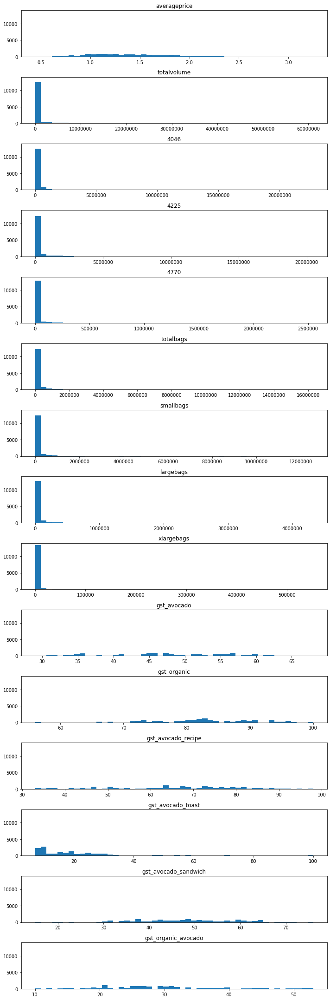

In [16]:
#collect all column names which are of datatype float64
floats = list(train.select_dtypes(['float64']).columns)
len_floats = len(floats)

#plot histograms of all columns of datatype float64
fig,a =  plt.subplots(nrows=len_floats, ncols=1, sharey=True, tight_layout=True)
fig.set_size_inches(10,30)
for i in range(len_floats):
    a[i].set_title(floats[i])
    a[i].ticklabel_format(style='plain') #turns off scientific notation
    a[i].hist(train[floats[i]], bins=50)
plt.show()

### Try  Z-score Normalizing

In [17]:
#standardize
from sklearn.preprocessing import StandardScaler

In [18]:
scaler = StandardScaler()
scaler.fit(train[floats])
scaled_train_floats = scaler.transform(train[floats])

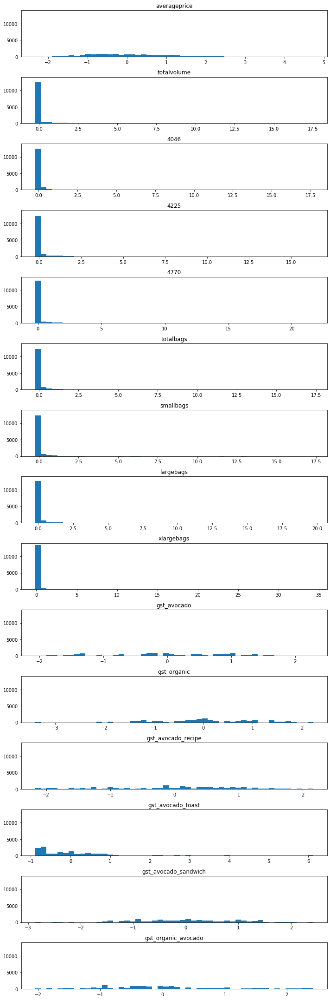

In [19]:
#plot histograms of all columns of datatype float64
fig,a =  plt.subplots(nrows=len_floats, ncols=1, sharey=True, tight_layout=True)
fig.set_size_inches(10,30)
for i in range(len_floats):
    a[i].set_title(floats[i])
    a[i].ticklabel_format(style='plain') #turns off scientific notation
    a[i].hist(scaled_train_floats[:, i], bins=50)
plt.show()

### Try MinMax Scaling

In [20]:
#standardize
from sklearn.preprocessing import MinMaxScaler

In [21]:
scaler = MinMaxScaler()
scaler.fit(train[floats])
minmax_scaled_train_floats = scaler.transform(train[floats])

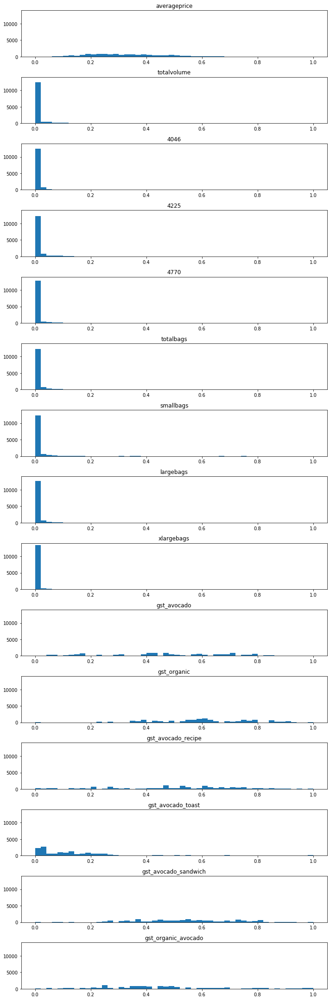

In [22]:
#plot histograms of all columns of datatype float64
fig,a = plt.subplots(nrows=len_floats, ncols=1, sharey=True, tight_layout=True)
fig.set_size_inches(10,30)
for i in range(len_floats):
    a[i].set_title(floats[i])
    a[i].ticklabel_format(style='plain') #turns off scientific notation
    a[i].hist(minmax_scaled_train_floats[:, i], bins=50)
plt.show()

### Try log() + MinMax Scaling
To preserve the orginial distribution for the highly skewed x-vars.

In [23]:
log_train =  train[floats].apply(np.log, axis=0)

In [24]:
#create numpy array
log_train_arr = np.array(log_train)

#find min and max values for each column, ignoring nan, -inf, and inf
mins = [np.nanmin(log_train_arr[:, i][log_train_arr[:, i] != -np.inf]) for i in range(log_train_arr.shape[1])]
maxs = [np.nanmax(log_train_arr[:, i][log_train_arr[:, i] != np.inf]) for i in range(log_train_arr.shape[1])]

#go through matrix one column at a time and replace  + and -infinity with the max or min for that column
for i in range(log_train_arr.shape[1]):
    log_train_arr[:, i][log_train_arr[:, i] == -np.inf] = mins[i]
    log_train_arr[:, i][log_train_arr[:, i] == np.inf] = maxs[i]

In [25]:
scaler = MinMaxScaler()
scaler.fit(log_train_arr)
minmax_scaled_log = scaler.transform(log_train_arr)

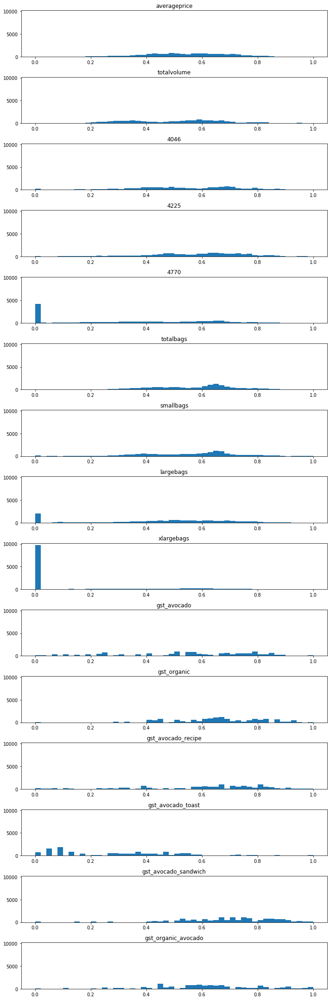

In [26]:
#plot histograms of all columns of datatype float64
fig,a = plt.subplots(nrows=len_floats, ncols=1, sharey=True, tight_layout=True)
fig.set_size_inches(10,30)
for i in range(len_floats):
    a[i].set_title(floats[i])
    a[i].ticklabel_format(style='plain') #turns off scientific notation
    a[i].hist(minmax_scaled_log[:, i], bins=50)
plt.show()

### Try cube root + MinMax Scaling
To preserve the orginial distribution for the highly skewed x-vars.

In [27]:
cuberoot_train =  train[floats].apply(np.cbrt, axis=0)

In [28]:
scaler = MinMaxScaler()
scaler.fit(cuberoot_train)
cuberoot_minmax_scaled = scaler.transform(cuberoot_train)

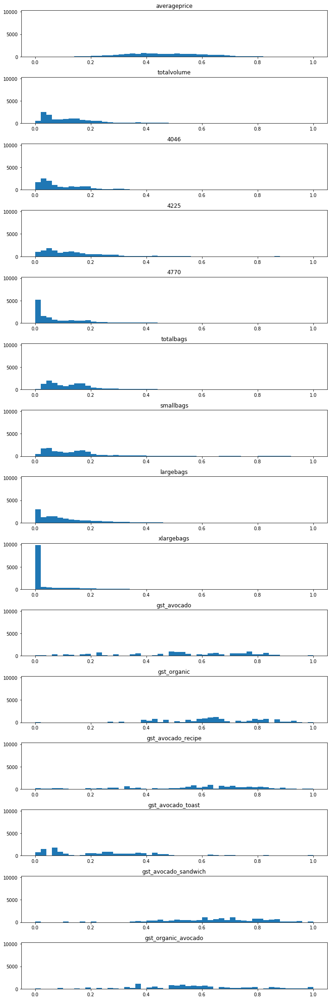

In [29]:
#plot histograms of all columns of datatype float64
fig,a = plt.subplots(nrows=len_floats, ncols=1, sharey=True, tight_layout=True)
fig.set_size_inches(10,30)
for i in range(len_floats):
    a[i].set_title(floats[i])
    a[i].ticklabel_format(style='plain') #turns off scientific notation
    a[i].hist(cuberoot_minmax_scaled[:, i], bins=50)
plt.show()

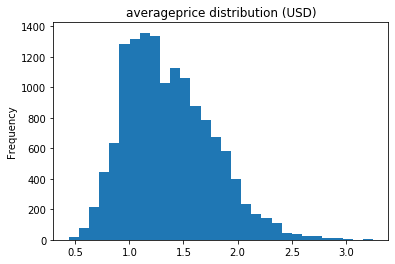

In [30]:
train["averageprice"].plot(kind="hist", bins=30, title='averageprice distribution (USD)')

averageprice follows an approximately normal distribution with a slight skew.

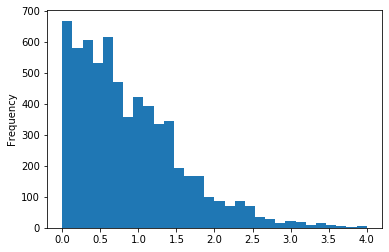

In [31]:
#convert array to df
scaled_train_floats_df = pd.DataFrame(scaled_train_floats, columns=floats)
#plot scaled data
scaled_train_floats_df['averageprice'].plot(kind="hist", bins=30, range=(0,4))

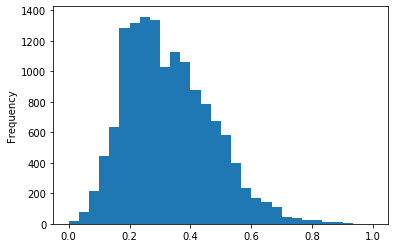

In [32]:
#convert array to df
minmax_scaled_train_floats_df = pd.DataFrame(minmax_scaled_train_floats, columns=floats)
#plot scaled data
minmax_scaled_train_floats_df['averageprice'].plot(kind="hist", bins=30, range=(0,1))

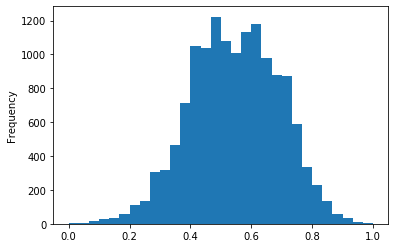

In [33]:
#convert array to df
minmax_scaled_log_df = pd.DataFrame(minmax_scaled_log, columns=floats)
#plot scaled data
minmax_scaled_log_df['averageprice'].plot(kind="hist", bins=30, range=(0,1))

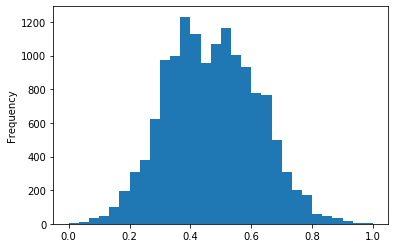

In [34]:
#convert array to df
cuberoot_minmax_scaled_df = pd.DataFrame(cuberoot_minmax_scaled, columns=floats)
#plot scaled data
cuberoot_minmax_scaled_df['averageprice'].plot(kind="hist", bins=30, range=(0,1))

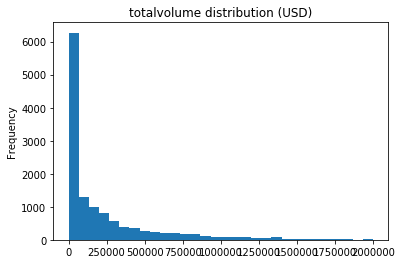

In [35]:
train["totalvolume"].plot(kind="hist", bins=30, range=(0,.2e7), title='totalvolume distribution (USD)')

totalvolume follows the Pareto distriution.

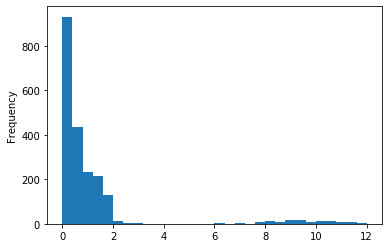

In [36]:
#plot scaled data
scaled_train_floats_df['totalvolume'].plot(kind="hist", bins=30, range=(0,12))

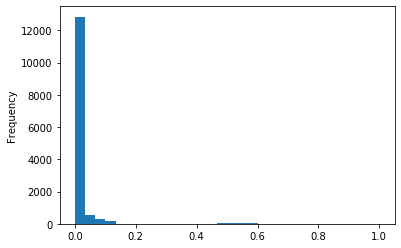

In [37]:
#plot scaled data
minmax_scaled_train_floats_df['totalvolume'].plot(kind="hist", bins=30, range=(0,1))

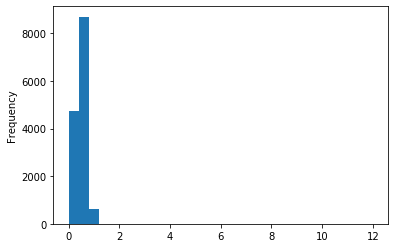

In [38]:
#plot scaled data
minmax_scaled_log_df['totalvolume'].plot(kind="hist", bins=30, range=(0,12))

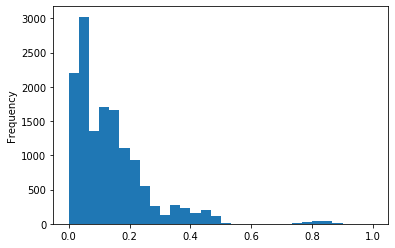

In [39]:
#plot scaled data
cuberoot_minmax_scaled_df['totalvolume'].plot(kind="hist", bins=30, range=(0,1))

#### Final thoughts on normalization
MinMax Normalization seems to preserve the shape of the normally distributed data best, but Z-score Standardization seems to work best in preserving the Pareto-distributed data. However using both will mean that there will be a mix of data centered at zero and data in the range [0, 1]. It is best to have all variables on the same scale. Since `averageprice` is the main target of interest, is normally distributed, and falls in the relatively small range [0.44, 3.25], we will leave it on its origninal scale and use Z-score normalization on the rest.

Log + MinMax and Cube Root + MinMax normalization don't seem to improve over just MinMax scaling.

### Boxplots

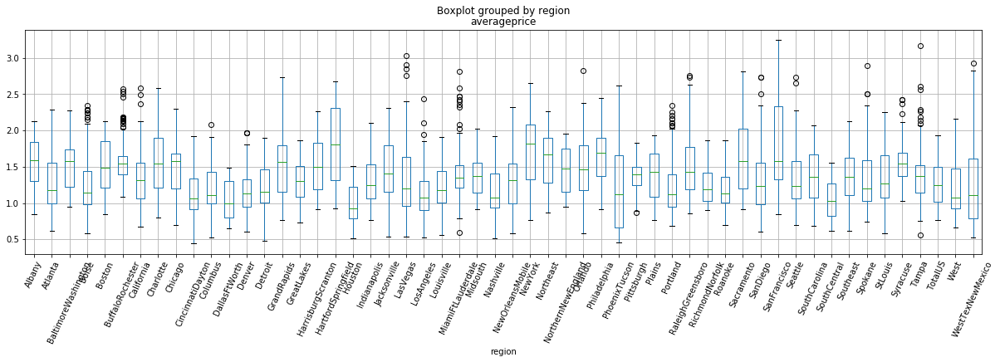

In [40]:
train.boxplot(column='averageprice', by='region', ax=None, fontsize=None, rot=65, grid=True, figsize=(20,5), layout=None, 
           return_type=None)

In [41]:
#create an ordered (by median) version of the above plot:
def boxplot_sorted(df, by, column):
    #sort data by median values
    df2 = pd.DataFrame({col:vals[column] for col, vals in df.groupby(by)})
    medians = df2.median().sort_values()
    means = df2.mean().sort_values()
    
    #make the boxplot
    df2[medians.index].boxplot(rot=65, figsize=(20,5))
    plt.title('{} across {}'.format(column, by))
    plt.show()
    return medians, means

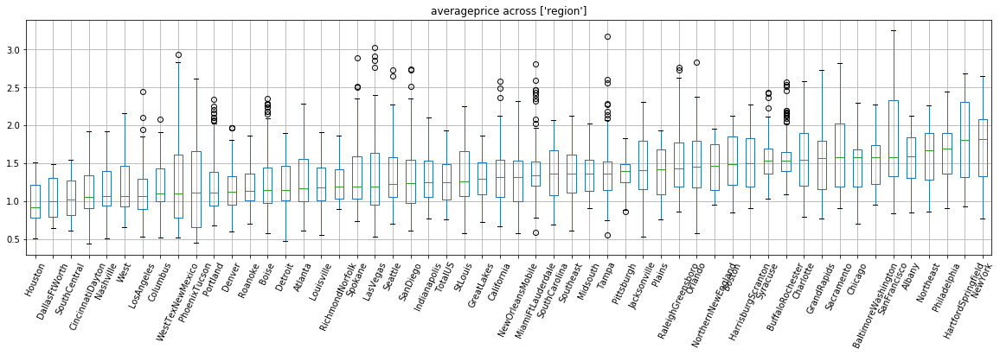

In [42]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','averageprice']]
#reset the index to avoid 'ValueError: cannot reindex from a duplicate axis'
subset.reset_index(inplace=True)
#drop the unnecessary date column
subset.drop('date', axis=1, inplace=True)  
#call the function
medians, means = boxplot_sorted(subset, by=["region"], column="averageprice")

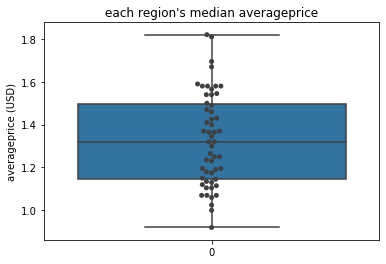

In [43]:
ax = sns.boxplot(data=medians, showfliers = False)
ax = sns.swarmplot(data=medians, color=".25")
plt.title('each region\'s median averageprice')
plt.ylabel('averageprice (USD)')
plt.show()

In [44]:
#add median totalvolume var
quantiles = list(medians.quantile([0.25,0.5,0.75]))

#grab the index where the quantile cutoff lies
first_idx = np.where(medians < quantiles[0])[0][-1]+1
second_idx = np.where(medians < quantiles[1])[0][-1]+1
third_idx = np.where(medians < quantiles[2])[0][-1]+1

#grab the series of the cities in each quantile
first_series = medians[:first_idx]
second_series = medians[first_idx:second_idx]
third_series = medians[second_idx:third_idx]
fourth_series = medians[third_idx:]

#grab the names of the cities in each quantile
first = list(first_series.index)
second = list(second_series.index)
third = list(third_series.index)
fourth = list(fourth_series.index)

#add a column for the quantile of the median averageprice per city
train['median_averageprice_quantile'] = ['first' if region in first else \
                                     'second' if region in second else \
                                     'third' if region in third else \
                                     'fourth' if region in fourth else \
                                     'None' for region in train.region]

C:\Users\rc\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [45]:
#save lists to use in later data pre-processing
lists = [first, second, third, fourth]

#get working directory
wd = os.getcwd()
for i in range(len(lists)):
    with open(wd + '\\averageprice_list_{}.csv'.format(i), 'w', newline='') as myfile:
         wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
         wr.writerow(lists[i])

In [46]:
set(train['region'])

{'Albany',
 'Atlanta',
 'BaltimoreWashington',
 'Boise',
 'Boston',
 'BuffaloRochester',
 'California',
 'Charlotte',
 'Chicago',
 'CincinnatiDayton',
 'Columbus',
 'DallasFtWorth',
 'Denver',
 'Detroit',
 'GrandRapids',
 'GreatLakes',
 'HarrisburgScranton',
 'HartfordSpringfield',
 'Houston',
 'Indianapolis',
 'Jacksonville',
 'LasVegas',
 'LosAngeles',
 'Louisville',
 'MiamiFtLauderdale',
 'Midsouth',
 'Nashville',
 'NewOrleansMobile',
 'NewYork',
 'Northeast',
 'NorthernNewEngland',
 'Orlando',
 'Philadelphia',
 'PhoenixTucson',
 'Pittsburgh',
 'Plains',
 'Portland',
 'RaleighGreensboro',
 'RichmondNorfolk',
 'Roanoke',
 'Sacramento',
 'SanDiego',
 'SanFrancisco',
 'Seattle',
 'SouthCarolina',
 'SouthCentral',
 'Southeast',
 'Spokane',
 'StLouis',
 'Syracuse',
 'Tampa',
 'TotalUS',
 'West',
 'WestTexNewMexico'}

As we can see above, region clearly has an effect on averageprice. There are a lot of regions which would increase model complexity, so let's see if we can summarize this regional data.

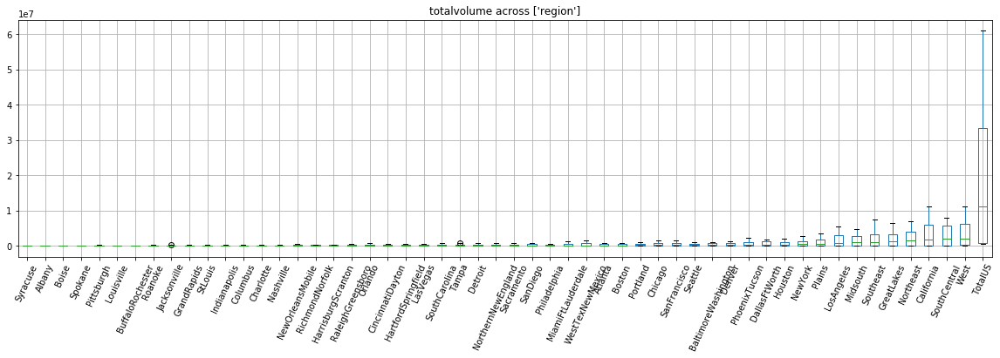

In [47]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','totalvolume']]
#reset the index to avoid 'ValueError: cannot reindex from a duplicate axis'
subset.reset_index(inplace=True)
#drop the unnecessary date column
subset.drop('date', axis=1, inplace=True)  

#call the function
medians, means = boxplot_sorted(subset, by=["region"], column="totalvolume")

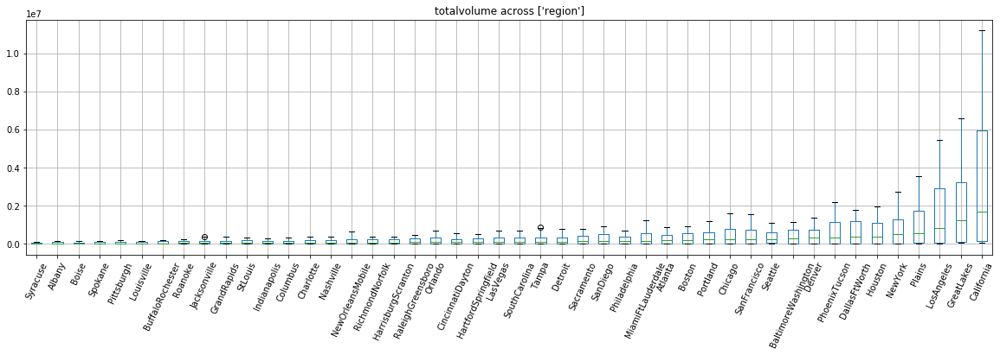

In [48]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','totalvolume']]
#reset the index to avoid 'ValueError: cannot reindex from a duplicate axis'
subset.reset_index(inplace=True)
#drop the unnecessary date column
subset.drop('date', axis=1, inplace=True)  
#throw out regions so we can compare cities since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region != 'West') & \
                (subset.region != 'WestTexNewMexico') & \
                (subset.region != 'Northeast') & \
                (subset.region != 'NorthernNewEngland') & \
                (subset.region != 'SouthCentral') & \
                (subset.region != 'Southeast') & \
                (subset.region != 'Midsouth')  \
               ]
#call the function
medians, means = boxplot_sorted(subset, by=["region"], column="totalvolume")

There is a lot of variance in totalvolume based on city. Perhaps that's best summarized via the overall region.

In [49]:
means

Syracuse               3.096041e+04
Boise                  4.288412e+04
Albany                 4.592804e+04
Louisville             4.723047e+04
Spokane                4.724637e+04
Pittsburgh             5.236688e+04
BuffaloRochester       6.588637e+04
Roanoke                7.266768e+04
Jacksonville           8.491433e+04
Columbus               8.734098e+04
Indianapolis           8.740600e+04
GrandRapids            9.161999e+04
StLouis                9.680935e+04
Charlotte              1.005041e+05
Nashville              1.006340e+05
HarrisburgScranton     1.219817e+05
RichmondNorfolk        1.229629e+05
CincinnatiDayton       1.313730e+05
NewOrleansMobile       1.344073e+05
RaleighGreensboro      1.372394e+05
HartfordSpringfield    1.494162e+05
LasVegas               1.643724e+05
Orlando                1.683859e+05
SouthCarolina          1.749789e+05
Detroit                1.835730e+05
Tampa                  1.888377e+05
Philadelphia           2.083100e+05
Sacramento             2.197

In [50]:
medians

Syracuse                 18940.705
Albany                   22388.820
Boise                    28988.585
Spokane                  29169.715
Pittsburgh               33477.095
Louisville               33507.365
BuffaloRochester         34503.530
Roanoke                  47884.295
Jacksonville             48820.530
GrandRapids              56591.345
StLouis                  57518.605
Indianapolis             59620.045
Columbus                 64674.640
Charlotte                71595.735
Nashville                75184.450
NewOrleansMobile         77539.150
RichmondNorfolk          77718.740
HarrisburgScranton       79684.015
RaleighGreensboro        96858.760
Orlando                 100495.440
CincinnatiDayton        102706.690
HartfordSpringfield     106799.980
LasVegas                116789.145
SouthCarolina           117021.800
Tampa                   119288.610
Detroit                 122415.755
Sacramento              142027.340
SanDiego                147817.650
Philadelphia        

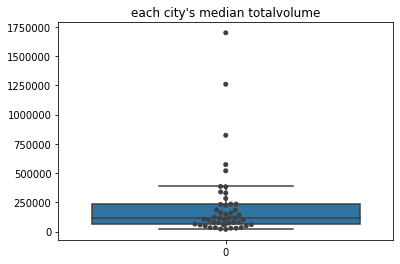

In [51]:
ax = sns.boxplot(data=medians, showfliers = False)
ax = sns.swarmplot(data=medians, color=".25")
plt.title('each city\'s median totalvolume')
plt.show()

Since we've seen that many of the x-vars follow the Pareto distribution, including totalvolume, we will use median as a summary statistic as opposed to the mean (since outliers highly influence the mean).

In [52]:
#add median totalvolume var
quantiles = list(medians.quantile([0.25,0.5,0.75]))

#grab the index where the quantile cutoff lies
first_idx = np.where(medians < quantiles[0])[0][-1]+1
second_idx = np.where(medians < quantiles[1])[0][-1]+1
third_idx = np.where(medians < quantiles[2])[0][-1]+1

#grab the series of the cities in each quantile
first_series = medians[:first_idx]
second_series = medians[first_idx:second_idx]
third_series = medians[second_idx:third_idx]
fourth_series = medians[third_idx:]

#grab the names of the cities in each quantile
first = list(first_series.index)
second = list(second_series.index)
third = list(third_series.index)
fourth = list(fourth_series.index)[:-1] #remove the last item (Denver); it's an outlier and can be it's own label

#add a column for the quantile of the median totalvolume per city, where Denver is on its 
#own as an outlier, and non-city entries are lableled big_region
train['median_totalvolume_quantile'] = ['first' if region in first else \
                                     'second' if region in second else \
                                     'third' if region in third else \
                                     'fourth' if region in fourth else \
                                     'denver' if region == 'Denver' else\
                                     'big_region' for region in train.region]

C:\Users\rc\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [53]:
#save lists to use in later data pre-processing
lists = [first, second, third, fourth]

#get working directory
wd = os.getcwd()
for i in range(len(lists)):
    with open(wd + '\\totalvolume_list_{}.csv'.format(i), 'w', newline='') as myfile:
         wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
         wr.writerow(lists[i])

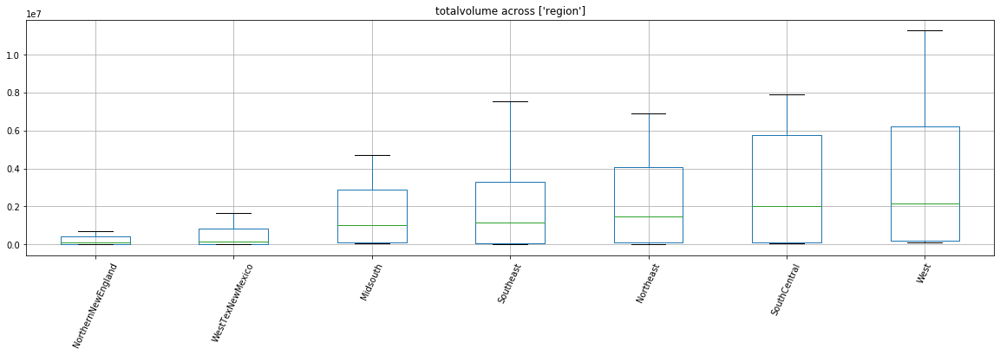

In [54]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','totalvolume']]
#reset the index to avoid 'ValueError: cannot reindex from a duplicate axis'
subset.reset_index(inplace=True)
#drop the unnecessary date column
subset.drop('date', axis=1, inplace=True)  
#throw out cities so we can compare regions since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region == 'West') | \
                (subset.region == 'WestTexNewMexico') | \
                (subset.region == 'Northeast') | \
                (subset.region == 'NorthernNewEngland') | \
                (subset.region == 'SouthCentral') | \
                (subset.region == 'Southeast') | \
                (subset.region == 'Midsouth')  \
               ]
#call the function
medians, means = boxplot_sorted(subset, by=["region"], column="totalvolume")

In [55]:
medians

NorthernNewEngland     124411.035
WestTexNewMexico       174380.535
Midsouth              1000997.200
Southeast             1154636.390
Northeast             1478688.420
SouthCentral          2005923.605
West                  2174024.530
dtype: float64

There are a lot more avocadoes being sold in the West.

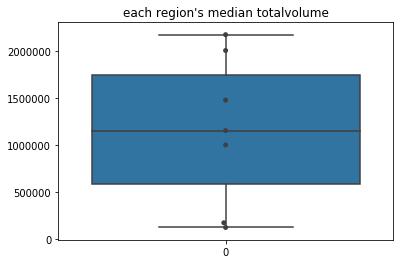

In [56]:
ax = sns.boxplot(data=medians, showfliers = False)
ax = sns.swarmplot(data=medians, color=".25")
plt.title('each region\'s median totalvolume')
plt.show()

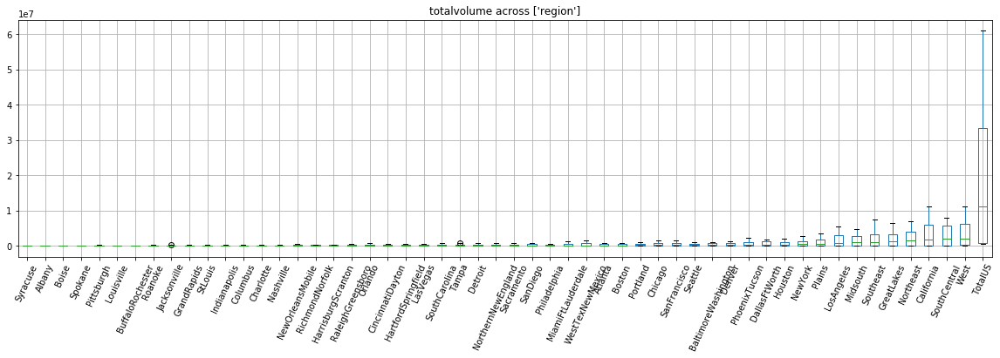

In [57]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','totalvolume']]
#reset the index to avoid 'ValueError: cannot reindex from a duplicate axis'
subset.reset_index(inplace=True)
#drop the unnecessary date column
subset.drop('date', axis=1, inplace=True)  

#call the function
medians, means = boxplot_sorted(subset, by=["region"], column="totalvolume")

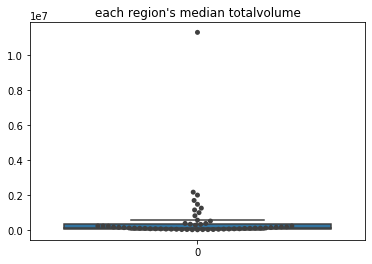

In [58]:
ax = sns.boxplot(data=medians, showfliers = False)
ax = sns.swarmplot(data=medians, color=".25")
plt.title('each region\'s median totalvolume')
plt.show()

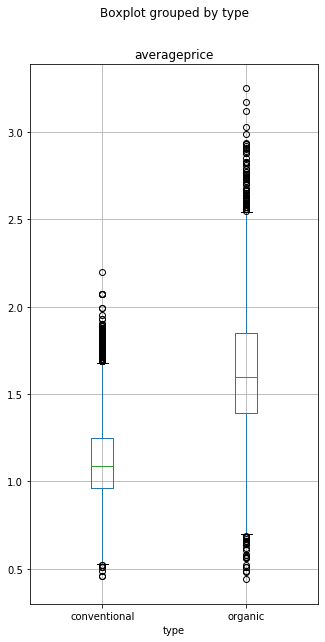

In [59]:
train.boxplot(column='averageprice', by='type', ax=None, fontsize=None, rot=0, grid=True, figsize=(5,10), layout=None, 
           return_type=None)

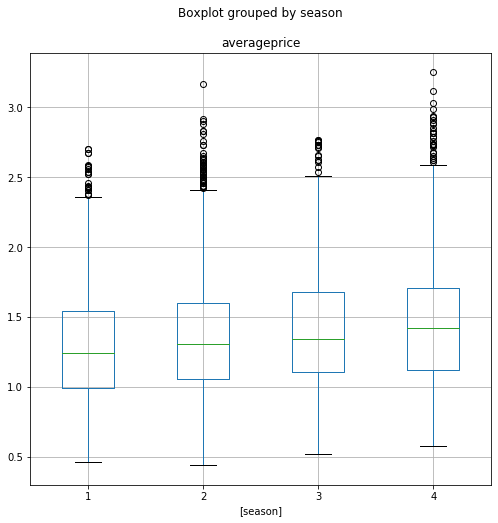

In [60]:
train.boxplot(column='averageprice', by=['season'], ax=None, fontsize=None, rot=0, grid=True, figsize=(8,8), layout=None, 
           return_type=None)

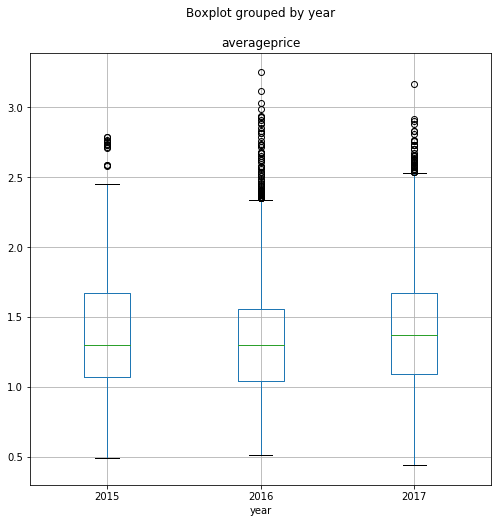

In [61]:
train.boxplot(column='averageprice', by='year', ax=None, fontsize=None, rot=0, grid=True, figsize=(8,8), layout=None, 
           return_type=None)

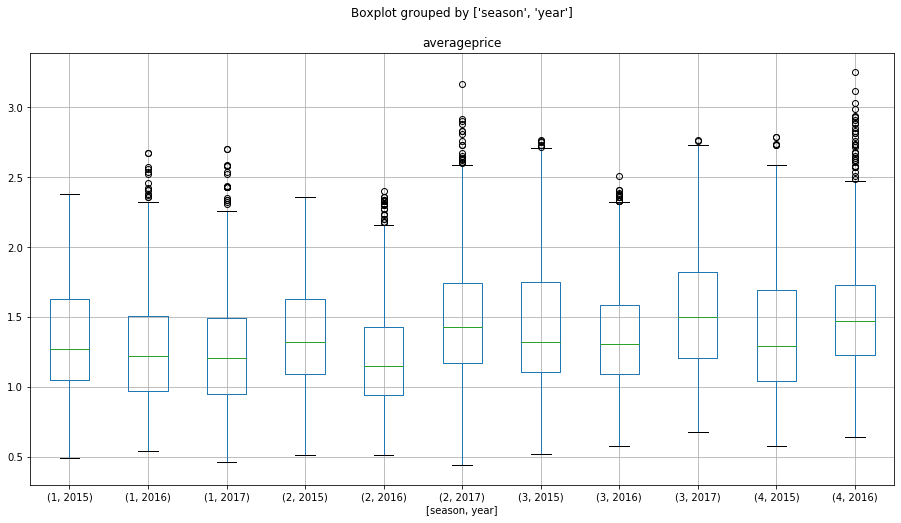

In [62]:
train.boxplot(column='averageprice', by=['season', 'year'], ax=None, fontsize=None, rot=0, grid=True, figsize=(15,8), layout=None, 
           return_type=None)

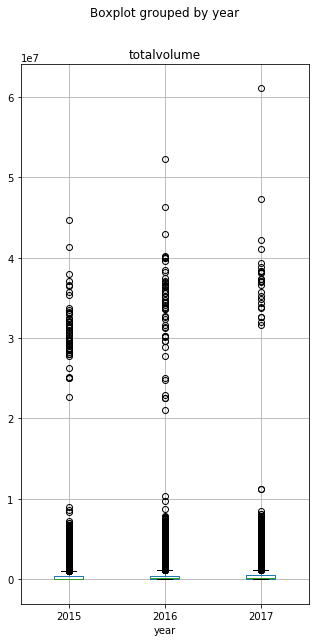

In [63]:
train.boxplot(column='totalvolume', by='year', ax=None, fontsize=None, rot=0, grid=True, figsize=(5,10), layout=None, 
           return_type=None)

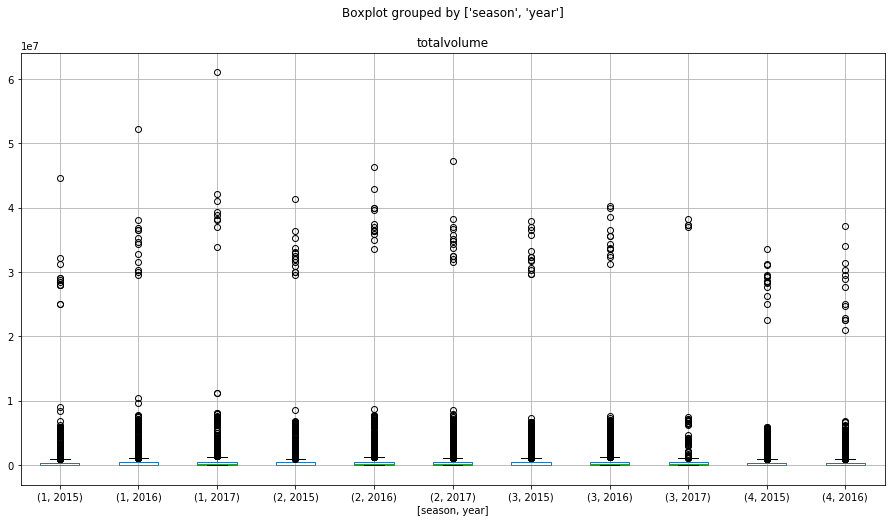

In [64]:
train.boxplot(column='totalvolume', by=['season', 'year'], ax=None, fontsize=None, rot=0, grid=True, figsize=(15,8), layout=None, 
           return_type=None)

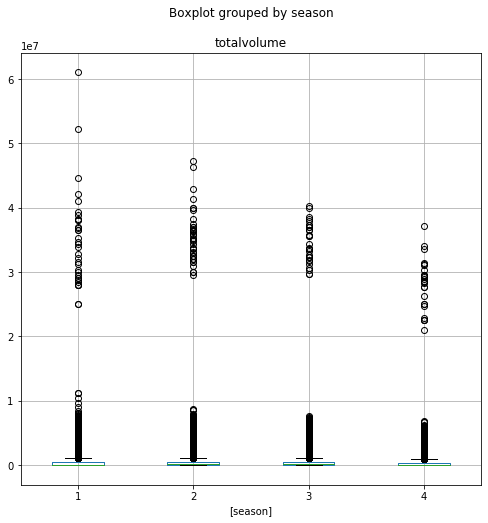

In [65]:
train.boxplot(column='totalvolume', by=['season'], ax=None, fontsize=None, rot=0, grid=True, figsize=(8,8), layout=None, 
           return_type=None)

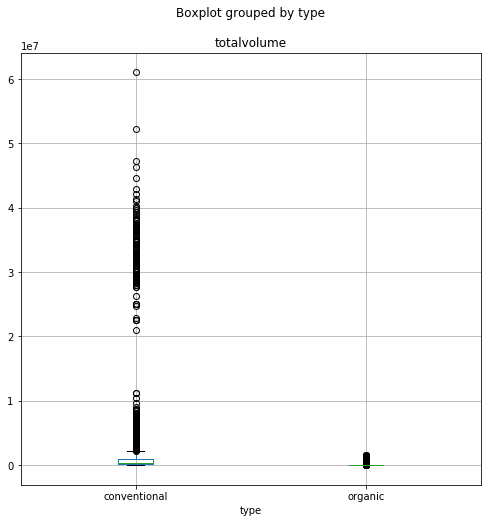

In [66]:
train.boxplot(column='totalvolume', by='type', ax=None, fontsize=None, rot=0, grid=True, figsize=(8,8), layout=None, 
           return_type=None)

### Correlation plots

In [67]:
# #create the correlation matrix
# corr = train[floats].corr()

# f, ax = plt.subplots(figsize=(10, 8))
# sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
#             square=True, ax=ax, vmin=-1, vmax=1,fmt='.2f', annot=True)
# ax.set_title('overall correlations\n')
# plt.show()

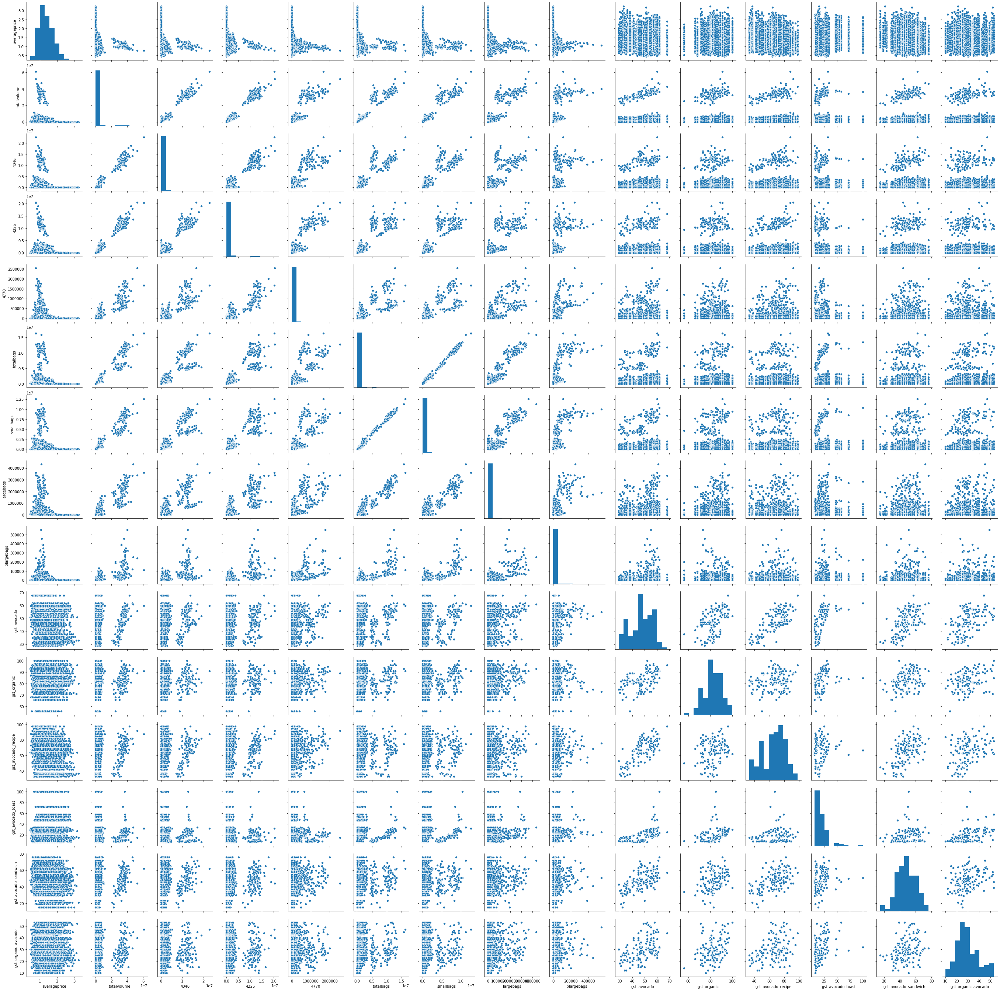

In [69]:
sns.pairplot(train[floats])

#### Plot correlation/scatter matrices for each value of `median_totalvolume_quantile`

In [70]:
# look at all possible values
set(train.median_totalvolume_quantile)

{'big_region', 'first', 'fourth', 'second', 'third'}

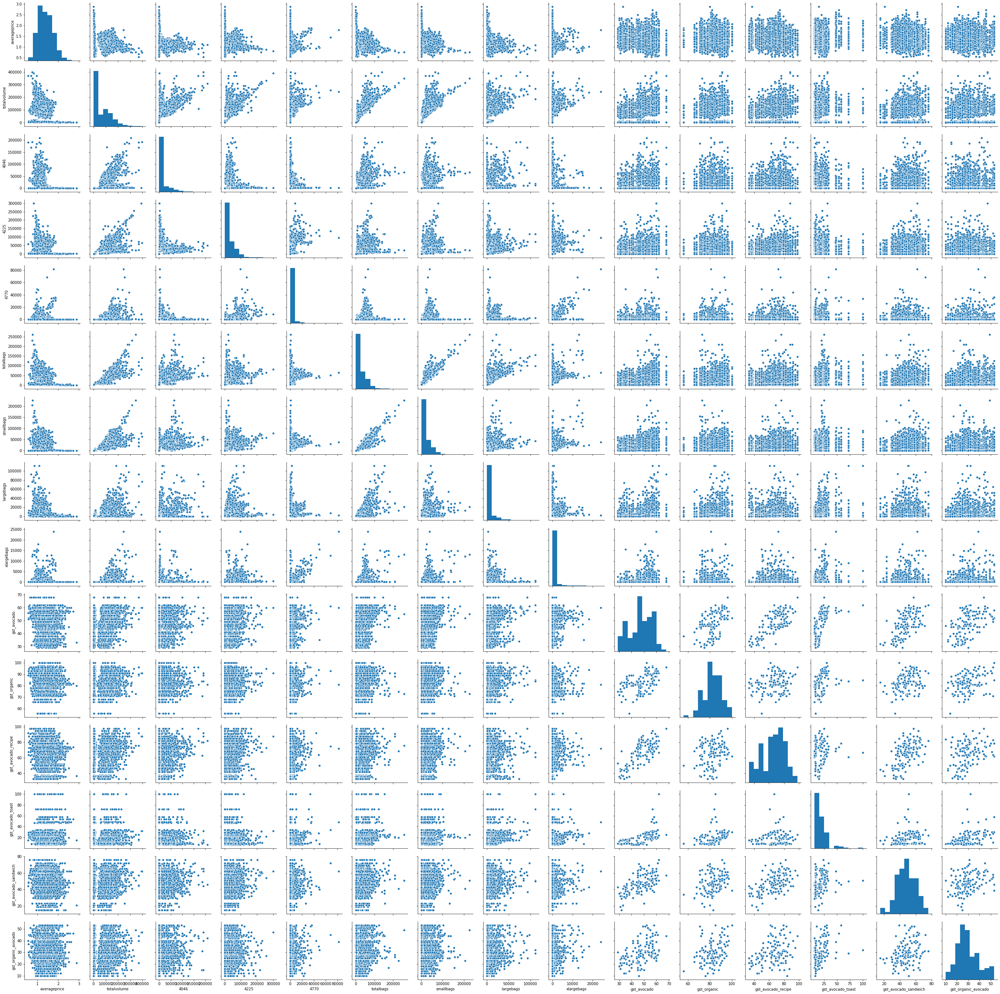

In [71]:
# subset and plot data where median_totalvolume_quantile == first
first = train[train['median_totalvolume_quantile']=='first']
sns.pairplot(first[floats])

In [72]:
# possible_values = set(train.median_totalvolume_quantile)

# for value in possible_values:
#     # subset and plot data where median_totalvolume_quantile == first
#     subset = train[train['median_totalvolume_quantile']==value]

#     #create the correlation matrix
#     corr = subset[floats].corr()

#     f, ax = plt.subplots(figsize=(10, 8))
#     sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
#                 square=True, ax=ax, vmin=-1, vmax=1, fmt='.2f', annot=True)
#     ax.set_title('median_totalvolume_quantile == {}\n'.format(value))
#     plt.show()
    

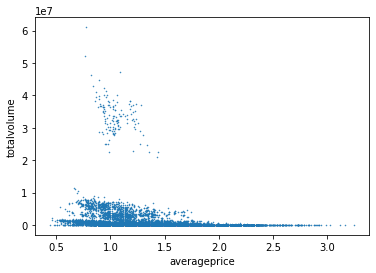

In [73]:
train.plot.scatter(x='averageprice', y='totalvolume', s=.25)

It looks like in most cases, amount sold and price have nothing to do with each other, however there are a moderate number of cases where a lower price is associated with more sold.

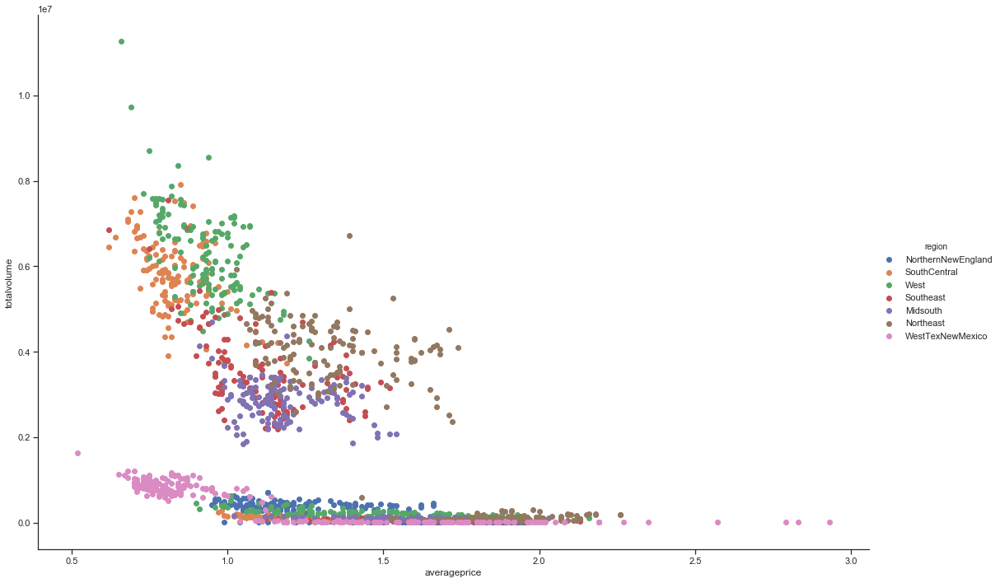

In [74]:
sns.set(style='ticks')

subset = train.loc[:, ['averageprice', 'totalvolume', 'region']].reset_index()

#throw out cities so we can compare regions since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region == 'West') | \
                (subset.region == 'WestTexNewMexico') | \
                (subset.region == 'Northeast') | \
                (subset.region == 'NorthernNewEngland') | \
                (subset.region == 'SouthCentral') | \
                (subset.region == 'Southeast') | \
                (subset.region == 'Midsouth')  \
               ]

_region = list(set(subset.region))
fg = sns.FacetGrid(data=subset, hue='region', hue_order=_region, aspect=1.61)
fg.fig.set_figwidth(15)
fg.fig.set_figheight(10)
fg.map(plt.scatter, 'averageprice', 'totalvolume').add_legend()

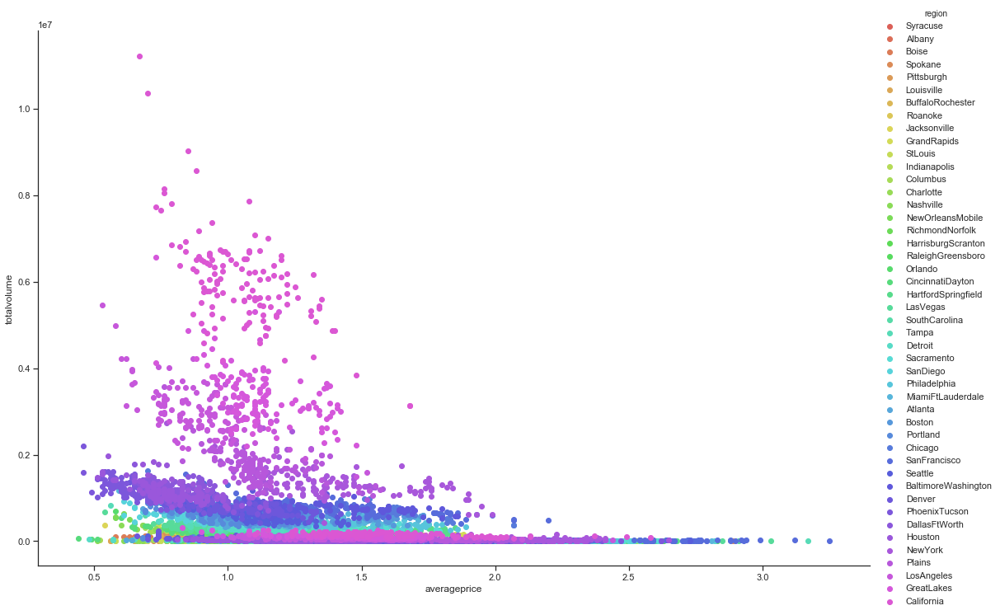

In [75]:
sns.set(style='ticks')

subset = train.loc[:, ['averageprice', 'totalvolume', 'region']].reset_index()

#throw out regions so we can compare cities since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region != 'West') & \
                (subset.region != 'WestTexNewMexico') & \
                (subset.region != 'Northeast') & \
                (subset.region != 'NorthernNewEngland') & \
                (subset.region != 'SouthCentral') & \
                (subset.region != 'Southeast') & \
                (subset.region != 'Midsouth')  \
               ]  


temp = pd.DataFrame({col:vals['totalvolume'] for col, vals in subset.groupby('region')})
medians = temp.median().sort_values()

sns.set_palette(sns.color_palette("hls", n_colors=len(set(train.region))))
fg = sns.FacetGrid(data=subset, hue='region', hue_order=medians.index, aspect=1.61)
fg.fig.set_figwidth(15)
fg.fig.set_figheight(10)
fg.map(plt.scatter, 'averageprice', 'totalvolume').add_legend()

In [78]:
corr = train[floats].corr()

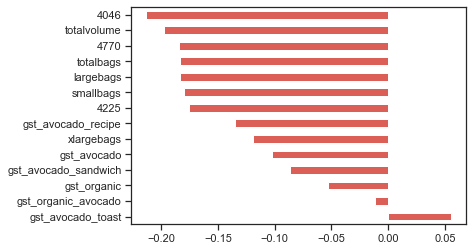

In [79]:
# how do x-vars correlate with averageprice?
(corr
     .averageprice
     .drop('averageprice') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

averageprice doesn't correlate very strongly with any of the x-vars.

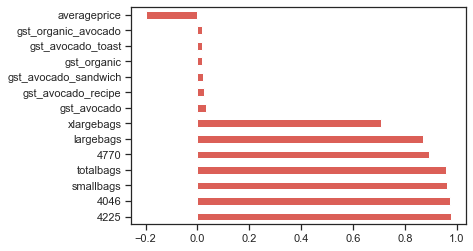

In [80]:
# how do x-vars correlate with totalvolume?
(corr
     .totalvolume
     .drop('totalvolume') # don't compare with myself
     .sort_values(ascending=False)
     .plot
     .barh())

totalvolume correlates strongly with all other indicators of amount sold, but nothing else. Since this is redundant information, we should remove those high correlates.

### Time series plots

In [81]:
#create a grouped linegraph (graphs the medians for each group):
def linegraph_grouped(dfs, titles, by, column, my_cmap='tab20b'):  
        
    for i in range(len(dfs)):
        #create a grouped df
        grouped_df = pd.DataFrame({col:vals[column] for col, vals in dfs[i].groupby(by)})
        medians = grouped_df.median().sort_values()        
  
        # plot
        ax = grouped_df[medians.index].plot(
            title='median {}, grouped by {} for {}'.format(column, by, titles[i]), 
            figsize=(25, 10), 
            x_compat=True,
        cmap=plt.get_cmap(my_cmap))
        # format the ticks
        ax.xaxis.set_major_locator(mdates.MonthLocator())
        plt.ylabel(column)     
    
    plt.show()

###################
Big Regions only:
###################


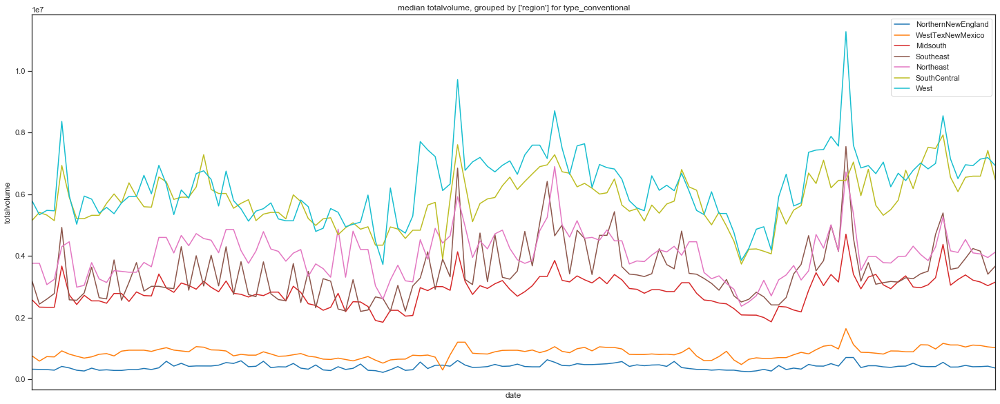

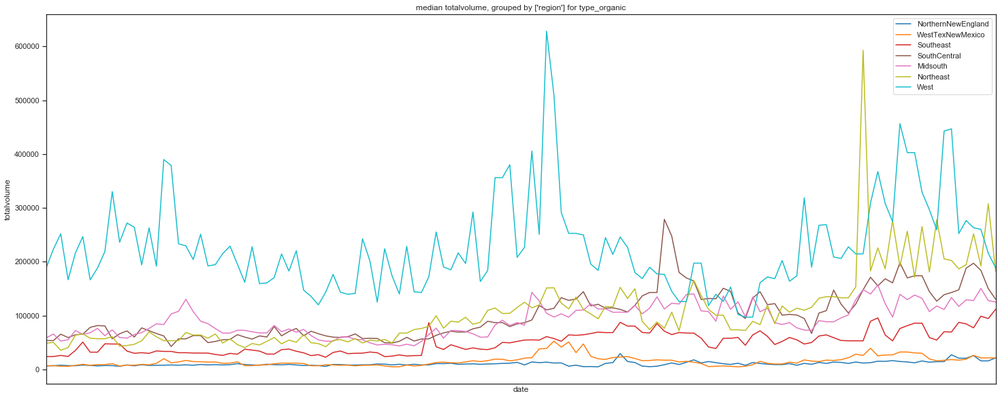

In [82]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','type', 'totalvolume']]

#throw out cities so we can compare regions since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region == 'West') | \
                (subset.region == 'WestTexNewMexico') | \
                (subset.region == 'Northeast') | \
                (subset.region == 'NorthernNewEngland') | \
                (subset.region == 'SouthCentral') | \
                (subset.region == 'Southeast') | \
                (subset.region == 'Midsouth')  \
               ]

#split dfs to look at conventional and organic prices separately
type_conventional = subset[subset.type == 'conventional']
type_organic = subset[subset.type == 'organic']

print('###################\nBig Regions only:\n###################')

#call the function
grouped_df = linegraph_grouped(dfs=[type_conventional, type_organic], titles=['type_conventional', 'type_organic'],
                               by=["region"], column="totalvolume",
                              my_cmap='tab10')

For the conventional avocados, the West has several distinct peaks in April 2015, Sept. 2015, April 2016, Nov. 2016, Aug. 2017. That looks roughly like there is a peak in spring and fall each year.

[Agricultural Marketing Research Center](https://www.agmrc.org/commodities-products/fruits/avocados): "The United States is a net importer of avocados from Mexico. Mexico supplied most of the avocados imported into the United States in 2017."

[Avocados from Mexico](https://avocadosfrommexico.com/avocados/avocado-journey/): "It’s during this bloom when the majority of avocados are produced. The crop is available in lower area orchards (1,100 to 1,600 meters) in **September**, in orchards below 2,100 meters in **October**, and in most all of the orchards in the state from **November through February**."

So the peak in the fall makes sense; there is more supply. The peak in spring is likely not due to supply, but perhaps people like to eat fresh in the spring.

The west is also much closer to Mexico geographically, so they may be more likely to get fresh, appetizing supply.

###################
Cities only:
###################


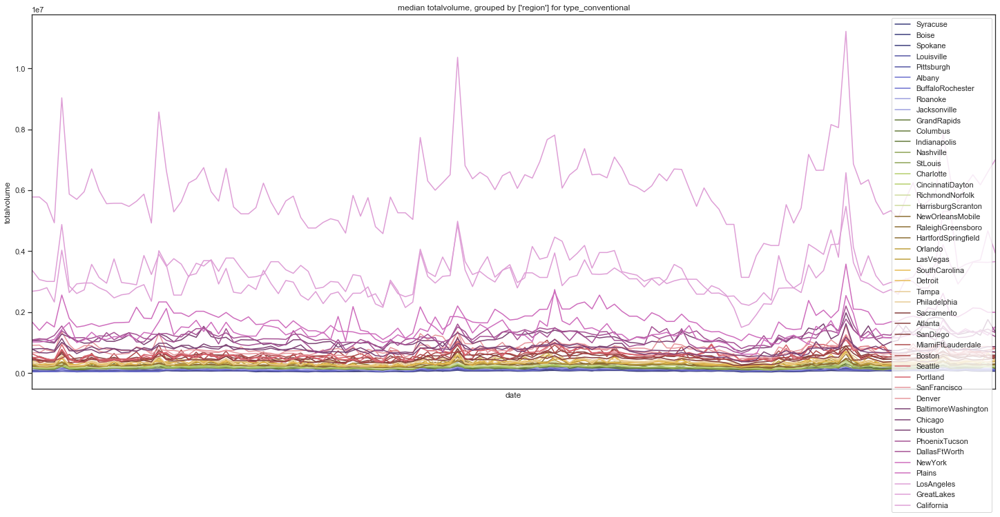

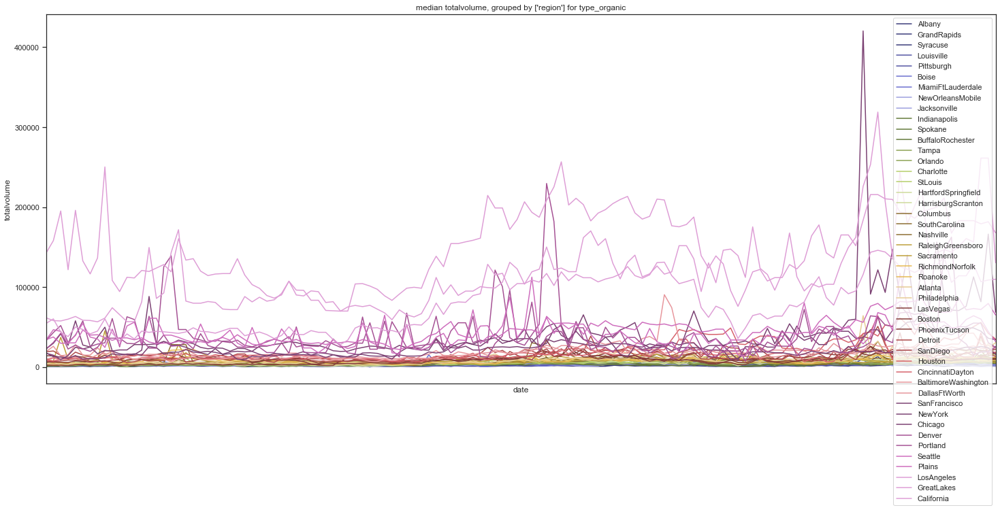

In [83]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','type', 'totalvolume']]

#throw out regions so we can compare cities since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region != 'West') & \
                (subset.region != 'WestTexNewMexico') & \
                (subset.region != 'Northeast') & \
                (subset.region != 'NorthernNewEngland') & \
                (subset.region != 'SouthCentral') & \
                (subset.region != 'Southeast') & \
                (subset.region != 'Midsouth')  \
               ]    

#split dfs to look at conventional and organic prices separately
type_conventional = subset[subset.type == 'conventional']
type_organic = subset[subset.type == 'organic']

print('###################\nCities only:\n###################')

#call the function
grouped_df = linegraph_grouped(dfs=[type_conventional, type_organic], titles=['type_conventional', 'type_organic'],
                               by=["region"], column="totalvolume")

###################
Big Regions only:
###################


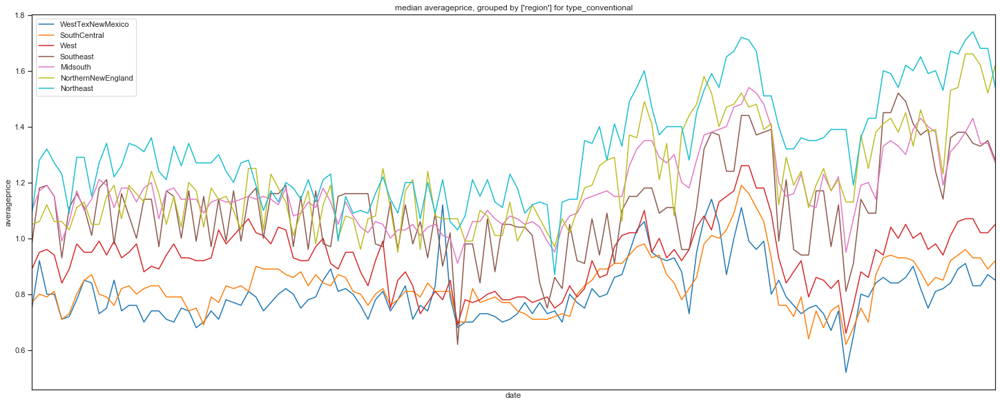

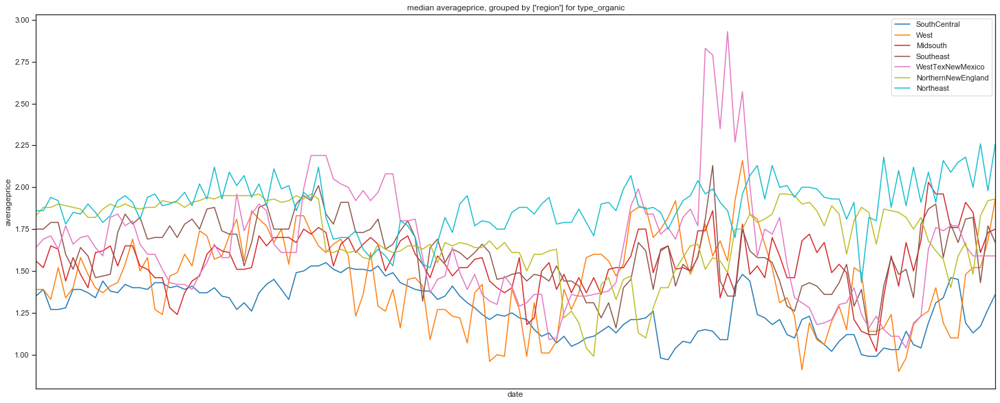

In [84]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','type', 'averageprice']]

#throw out cities so we can compare regions since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region == 'West') | \
                (subset.region == 'WestTexNewMexico') | \
                (subset.region == 'Northeast') | \
                (subset.region == 'NorthernNewEngland') | \
                (subset.region == 'SouthCentral') | \
                (subset.region == 'Southeast') | \
                (subset.region == 'Midsouth')  \
               ]

#split dfs to look at conventional and organic prices separately
type_conventional = subset[subset.type == 'conventional']
type_organic = subset[subset.type == 'organic']

print('###################\nBig Regions only:\n###################')

#call the function
grouped_df = linegraph_grouped(dfs=[type_conventional, type_organic], titles=['type_conventional', 'type_organic'],
                               by=["region"], column="averageprice",
                              my_cmap='tab10')

For conventional avocados:
- The Northeast tends to have the highest prices, which makes sense if the avocados are imported all the way from Mexico. 
- WestTexNewMexico tends to have the lowest prices, which makes sense because it's close to Mexico. 
- WestTexNewMexico tends to have lower prices than the West (though the west is also close to Mexico) possibly because the GDP of California (3 trillion in 2018) is larger than both Texas (1 trillion in 2018) and New Mexico (~1 trillion in 2017) combined, so things are more expensive when you include California [sources: Wikipedia]. 

The trends are slightly different for organic avocados.

###################
Cities only:
###################


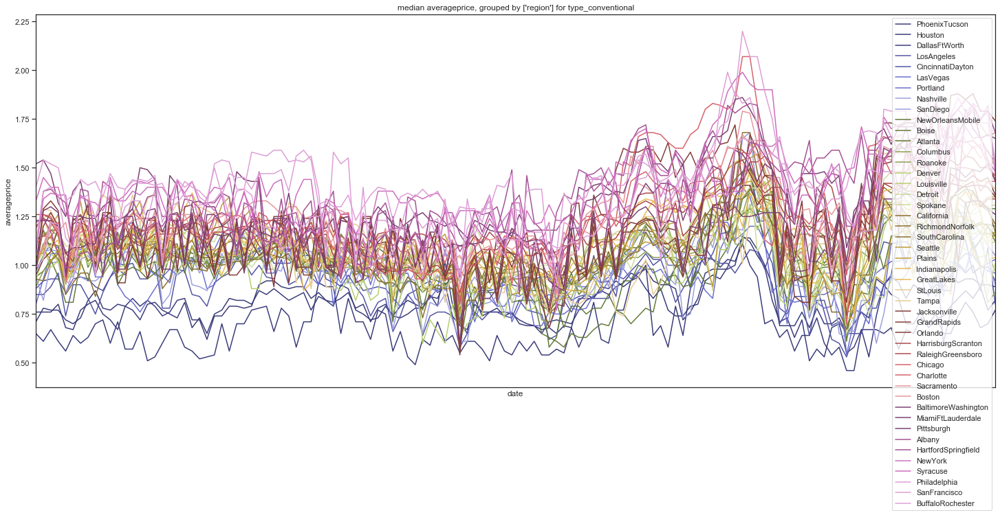

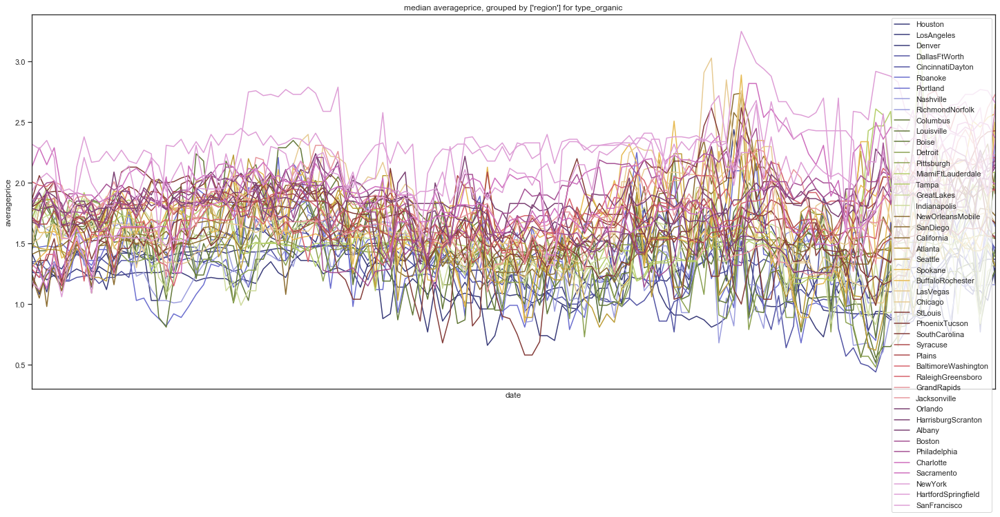

In [85]:
#take a subset to improve processing speed:
subset = train.loc[:, ['region','type', 'averageprice']]

#throw out regions so we can compare cities since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region != 'West') & \
                (subset.region != 'WestTexNewMexico') & \
                (subset.region != 'Northeast') & \
                (subset.region != 'NorthernNewEngland') & \
                (subset.region != 'SouthCentral') & \
                (subset.region != 'Southeast') & \
                (subset.region != 'Midsouth')  \
               ]    

#split dfs to look at conventional and organic prices separately
type_conventional = subset[subset.type == 'conventional']
type_organic = subset[subset.type == 'organic']

print('###################\nCities only:\n###################')

#call the function
grouped_df = linegraph_grouped(dfs=[type_conventional, type_organic], titles=['type_conventional', 'type_organic'],
                               by=["region"], column="averageprice")

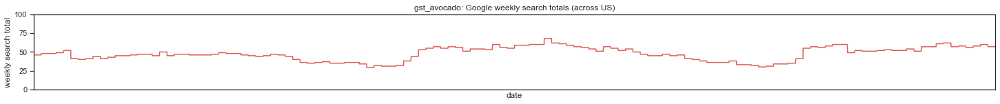

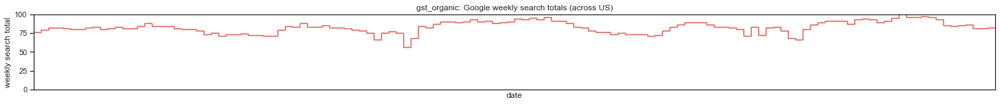

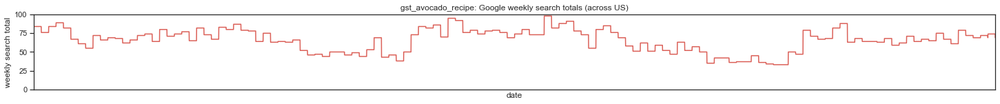

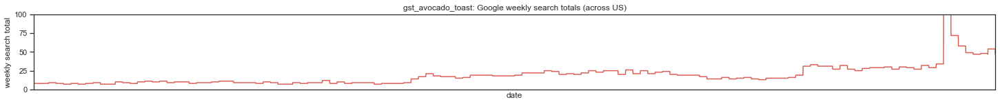

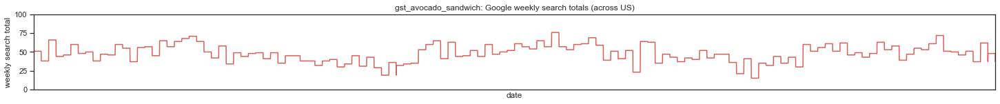

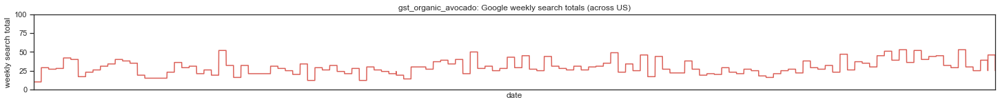

In [86]:
google_vars = google_df.columns

# figs, axes = plt.subplots(nrows=len(google_vars), ncols=1, figsize=(25, 40))
# fig.set_size_inches(10,30)
for var in google_vars:
    # plot
    ax = train[var].plot(
        title='{}: Google weekly search totals (across US)'.format(var), 
        figsize=(25, 2), 
        x_compat=True)
    # format the ticks
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_ylim(0,100)
    plt.ylabel('weekly search total')     
    
    plt.show()    

plt.show()

There doesn't seem to be an immediately obvious pattern to the search term totals.

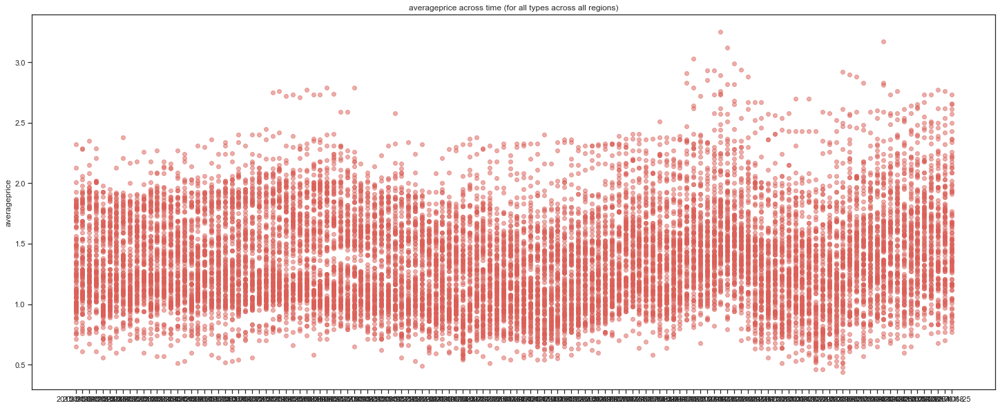

In [87]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(25, 10))
fig.set_size_inches(10,30)

plt.scatter(train.index, train.averageprice, alpha=0.5)
plt.title('averageprice across time (for all types across all regions)')
plt.ylabel('averageprice')

plt.show()

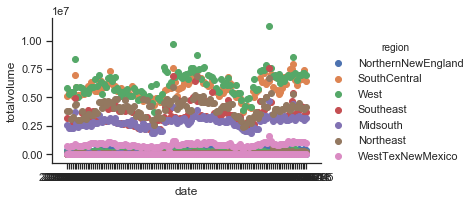

In [88]:
sns.set(style='ticks')

subset = train.loc[:, ['totalvolume', 'region']].reset_index()

#throw out cities so we can compare regions since it messes up the scale
subset = subset[(subset.region != 'TotalUS') & \
                (subset.region == 'West') | \
                (subset.region == 'WestTexNewMexico') | \
                (subset.region == 'Northeast') | \
                (subset.region == 'NorthernNewEngland') | \
                (subset.region == 'SouthCentral') | \
                (subset.region == 'Southeast') | \
                (subset.region == 'Midsouth')  \
               ]

_region = list(set(subset.region))
fg = sns.FacetGrid(data=subset, hue='region', hue_order=_region, aspect=1.61)
fg.map(plt.scatter, 'date', 'totalvolume').add_legend()

### Autocorrelation and partial autocorrelation plots
An autocorrelation is a summary of the relationship between observations at time t with observations with previous time steps (t-1, t-2, etc.).

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

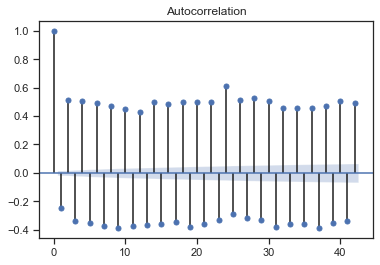

In [89]:
plot_acf(train.averageprice)
plt.show()

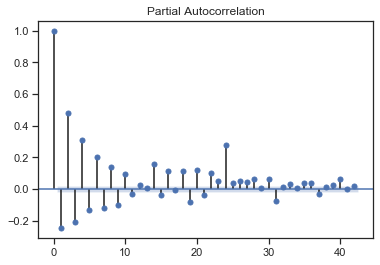

In [90]:
plot_pacf(train.averageprice)
plt.show()

The averageprice is pretty well correlation with itself at t-1 (r~.6), we should consider adding this as a variable to the model.

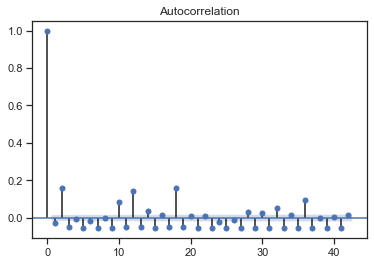

In [91]:
plot_acf(train.totalvolume)
plt.show()

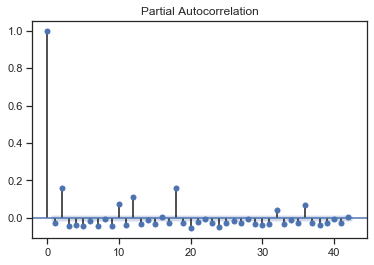

In [92]:
plot_pacf(train.totalvolume)
plt.show()

### Cross correlation plots
Plot the cross correlation between x and y with lag k.

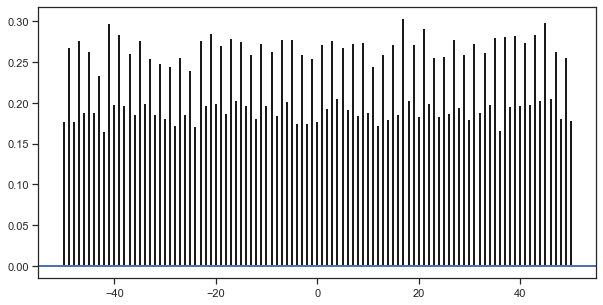

In [93]:
plt.figure(figsize = (10,5))
plt.xcorr(train.totalvolume, train.averageprice, usevlines=True, maxlags=50, normed=True, lw=2)
plt.show()

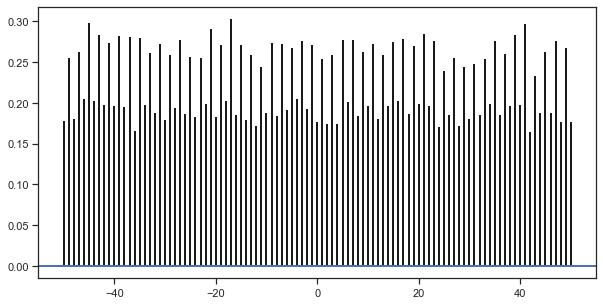

In [94]:
plt.figure(figsize = (10,5))
plt.xcorr(train.averageprice, train.totalvolume, usevlines=True, maxlags=50, normed=True, lw=2)
plt.show()